<a href="https://colab.research.google.com/github/ahmadhajmosa/Machine-Learning-Lab-2020/blob/Taraneh/Session_2_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab on Machine Learning and Applications in Intelligent Vehicles
## Session 1: Introduction


#Session 2: 05.06 - 13:00 - 14:30 :




## Intro:

Tensorflow is a powerful framework for implementing and deploying large-scale deep learning models. Recently, it has been widely used in both reasearch and production. TF objective is to combine scale and flexibility.

In the past session, we will learning the following:

1. TF programming stack
2. TF programming concepts including computatoin graphs, operations and sessions. 
3. Implementation of linear regression
4. Implementation of feed-forward neural networks

## TF stack:

TensorFlow is a framework composed of two core building blocks — a library for defining computational graphs and a runtime for executing such graphs on a variety of different hardware


![alt text](https://www.tensorflow.org/images/layers.png)


Before goining into details about the stack, let us talk about computational graphs.

### Computational Graphs

A directed graph is a data structure consisting of nodes (vertices) and edges. It’s a set of vertices connected pairwise by directed edges.

Graphs come in many shapes and sizes and are used to solve many real-life problems, such as representing networks including telephone networks, circuit networks, road networks, and even social networks. 
![alt text](https://cdn-images-1.medium.com/max/800/1*V6aYjD3AxDbEKYahkGqVQw.png)

TensorFlow uses directed graphs internally to represent computations, and they call this data flow graphs (or computational graphs).

The nodes in TF data flow graph mostly represents operations, variables and placeholders.

Take for example the following operation:
![alt text](https://cdn-images-1.medium.com/max/800/1*6E3sfit6DCeJ9mOz17g4bA.png)

To create a computational graph out of this program, we create nodes for each of the operations in our program, along with the input variables a and b. In fact, a and b could be constants if they don’t change. If one node is used as the input to another operation we draw a directed arrow that goes from one node to another.

The computational graph for this program might look like this:
![alt text](https://cdn-images-1.medium.com/max/800/1*vPb9E0Yd1QUAD0oFmAgaOw.png)

Operations create or manipulate data according to specific rules. In TensorFlow those rules are called Ops, short for operations. Variables on the other hand represent shared, persistent state that can be manipulated by running Ops on those variables.

The questions now what are the advantages of representing operations as directed graphs: The main advantage of using directed graphs is the ability to do **parallelism** and what is called **dependency driving scheduling**. 
For example, consider again the follwoing code:
![alt text](https://cdn-images-1.medium.com/max/800/1*6E3sfit6DCeJ9mOz17g4bA.png)
At the most fundamental level, most computer programs are mainly composed of two things — primitive operations and an order in which these operations are executed, often sequentially, line by line. This means we would first multiply a and b and only when this expression was evaluated we would take their sum. Computational graphs on the otherhand, exclusively specify the dependencies across the operations.
If we look at our computational graph we see that we could execute the multiplication and addition in parallel. That’s because these two operations do not depend on each other.
 So we can use the topology of the graph to drive the scheduling of operations and execute them in the most efficient manner, e.g. using multiple GPUs on a single machine or even distribute the execution across multiple machines.
 Another key advantage is portability. The graph is a language-independent representation of our code. So we can build the graph in Python, save the model (TensorFlow uses protocol buffers), and restore the model in a different language, say C++, if you want to go really fast.
 
 

--------------------------------
# References:

https://medium.com/@d3lm/understand-tensorflow-by-mimicking-its-api-from-scratch-faa55787170d

https://www.tensorflow.org/guide/extend/architecture

https://www.tensorflow.org/guide/low_level_intro

  
 






# placeholder: tensors are feeded externaly for example inputs tensors + output tensors

# variables : tensors represent the parameters of the network/graph ie. nn weights

In [2]:
import tensorflow as tf
import numpy as np

# Parameters
learning_rate = 0.001
training_iters = 2000
batch_size = 128

# Network Parameters

num_inputs = 3
num_outputs = 4
num_samples= 10
# Training data
x_gr = np.random.rand(num_samples,num_inputs)
y_gr = np.random.rand(num_samples,num_outputs)


# tf Graph input
x = tf.placeholder(tf.float32, [None, num_inputs])
y = tf.placeholder(tf.float32, [None, num_outputs])


# weights 
w_1 = tf.Variable(tf.random_normal([num_inputs,num_outputs ]))

# model
y_p = tf.matmul(x, w_1)


# cost

cost = tf.reduce_mean(tf.pow(y-y_p,2)) # 

# optimisation 

optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)

# initalizing the graph and the weights

init = tf.global_variables_initializer()

# Launch the graph
with tf.Session() as sess:
    
    sess.run(init)
    
    for i in range(10):
    
        sess.run(optimizer, feed_dict={x: x_gr, y: y_gr}) 

        pr_cost = sess.run(cost, feed_dict={x: x_gr,y: y_gr})
    
        print('iter: ',i, 'cost: ', pr_cost)
    
    y_p_p = sess.run(y_p, feed_dict={x: x_gr, y: y_gr})
    
    print('predicted ', y_p_p)
    print('real ', y_gr)



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
iter:  0 cost:  0.3191821
iter:  1 cost:  0.31818515
iter:  2 cost:  0.31719223
iter:  3 cost:  0.31620342
iter:  4 cost:  0.31521875
iter:  5 cost:  0.3142383
iter:  6 cost:  0.3132622
iter:  7 cost:  0.31229043
iter:  8 cost:  0.31132308
iter:  9 cost:  0.31036013
predicted  [[ 0.6430711   0.94389427  0.6271482   0.17762174]
 [ 0.6102386   0.6363406   0.18286934  0.1932221 ]
 [ 1.445669    1.1697323   0.7466489   0.17851576]
 [ 1.1262478   1.0206473   0.43448925  0.24621996]
 [ 1.4529346   1.2471442   0.83107984  0.18470147]
 [ 0.19004542  0.30657366 -0.13162938  0.1820072 ]
 [ 0.2920345   0.46096307  0.02317876  0.19219622]
 [ 1.0294749   0.27344668 -0.05175927  0.06832244]
 [ 0.68128616  1.478747    0.8360739   0.35843617]
 [ 0.6548267   0.3757431  -0.04899864  0.14760809]]
real  [[0.73588408 0.87850487 0.23937889 0.92821495]
 [0.04990279 0.20372216 0.93970511 0.75685907]
 [0.74989886 0.93

In [ ]:
sess = tf.Session() 
sess.run(init)
    
for i in range(10):
    
        sess.run(optimizer, feed_dict={x: x_gr, y: y_gr}) 

        pr_cost = sess.run(cost, feed_dict={x: x_gr,y: y_gr})
    
        print('iter: ',i, 'cost: ', pr_cost)
    
y_p_p = sess.run(y_p, feed_dict={x: x_gr, y: y_gr})
    
print('predicted ', y_p_p)
print('real ', y_gr)

#sess.close()

In [ ]:
import tensorflow as tf
import numpy as np

# Parameters
learning_rate = 0.001
training_iters = 2000
batch_size = 128

# Network Parameters

num_inputs = 3
num_h1_n = 4
num_h2_n = 10
num_outputs = 4

num_samples= 10

# Training data
x_gr = np.random.rand(num_samples,num_inputs)
y_gr = np.random.rand(num_samples,num_outputs)


# tf Graph input
x = tf.placeholder(tf.float32, [None, num_inputs])
y = tf.placeholder(tf.float32, [None, num_outputs])


# weights 
w_1 = tf.Variable(tf.random_normal([num_inputs,num_h1_n ]))
w_2 = tf.Variable(tf.random_normal([num_h1_n,num_h2_n ]))
w_3 = tf.Variable(tf.random_normal([num_h2_n,num_outputs ]))

# bias 
b_1 = tf.Variable(tf.random_normal([num_h1_n]))
b_2 = tf.Variable(tf.random_normal([num_h2_n]))
b_3 = tf.Variable(tf.random_normal([num_outputs]))




# model

h1 = tf.nn.sigmoid(tf.add(tf.matmul(x, w_1),b_1)) # model of hidden layer 1
h2 = tf.nn.sigmoid(tf.add(tf.matmul(h1, w_2),b_2)) # model of hidden layer 2
y_p = tf.add(tf.matmul(h2, w_3),b_3) # model of the output layer



# cost

cost = tf.reduce_mean(tf.pow(y-y_p,2)) # 

# optimisation 

optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)

# initalizing the graph and the weights

init = tf.global_variables_initializer()

# Launch the graph
with tf.Session() as sess:
    
    sess.run(init)
    
    for i in range(10):
    
        sess.run(optimizer, feed_dict={x: x_gr, y: y_gr}) 

        pr_cost = sess.run(cost, feed_dict={x: x_gr,y: y_gr})
    
        print('iter: ',i, 'cost: ', pr_cost)
    
    y_p_p = sess.run(y_p, feed_dict={x: x_gr, y: y_gr})
    
    print('predicted ', y_p_p)
    print('real ', y_gr)



In [ ]:
# training data
X_train = mnist.train.images
Y_train = mnist.train.labels

# training data
X_test = mnist.test.images
Y_test = mnist.test.labels

# training data
X_val = mnist.validation.images
Y_val = mnist.validation.labels


# Parameters
learning_rate = 0.001
training_iters = 2000
batch_size = 128

# Network Parameters

num_inputs = 784
num_h1_n = 100
num_h2_n = 100
num_outputs = 10



# tf Graph input
x = tf.placeholder(tf.float32, [None, num_inputs])
y = tf.placeholder(tf.float32, [None, num_outputs])


# weights 
w_1 = tf.Variable(tf.random_normal([num_inputs,num_h1_n ]))
w_2 = tf.Variable(tf.random_normal([num_h1_n,num_h2_n ]))
w_3 = tf.Variable(tf.random_normal([num_h2_n,num_outputs ]))

# bias 
b_1 = tf.Variable(tf.random_normal([num_h1_n]))
b_2 = tf.Variable(tf.random_normal([num_h2_n]))
b_3 = tf.Variable(tf.random_normal([num_outputs]))




# model

h1 = tf.nn.sigmoid(tf.add(tf.matmul(x, w_1),b_1)) # model of hidden layer 1
h2 = tf.nn.sigmoid(tf.add(tf.matmul(h1, w_2),b_2)) # model of hidden layer 2
y_p = tf.add(tf.matmul(h2, w_3),b_3) # model of the output layer



# cost

cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=y_p, labels=y)) # cross entropy cost


# Evaluate model
correct_pred = tf.equal(tf.argmax(y_p, 1), tf.argmax(y, 1))

## 3 images, y_p=[[0.1,0.0,0,0.9],[0.9,0.1,0,0.],[0,0.9,0,0.1]] 

# tf.argmax(y_p, 1) [3,0,1] 

# 3 images, y=[[0,0.0,0,1],[0,1,0,0],[0,1,0,0]] 

# tf.argmax(y, 1) [3,1,1]

# tf.equal [True,False,True]--[1,0,1]--- 2/3 

accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32))
#

# optimisation 

optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)

# initalizing the graph and the weights

init = tf.global_variables_initializer()

# Launch the graph
with tf.Session() as sess:
    
    sess.run(init)
    
    for i in range(1000):
        
        batch_x, batch_y = mnist.train.next_batch(batch_size)
        
        # Run optimization op (backprop)
        sess.run(optimizer, feed_dict={x: batch_x, y: batch_y})
    

        train_cost, train_acc  = sess.run([cost,accuracy], feed_dict={x: batch_x,y: batch_y})
    
        
        test_batch_x, test_batch_y = mnist.test.next_batch(batch_size)

        test_cost, test_acc  = sess.run([cost,accuracy], feed_dict={x: test_batch_x,y: test_batch_y})
        print('iter: ',i, 'train_cost: ', train_cost, 'train_acc: ', train_acc,'test_cost: ', test_cost, 'test_acc: ', test_acc )

    
    #y_p_p = sess.run(y_p, feed_dict={x: x_gr, y: y_gr})
    
    print('predicted ', y_p_p)
    print('real ', y_gr)




    

In [ ]:
import tensorflow as tf 


def variable_summaries(var):
  """Attach a lot of summaries to a Tensor (for TensorBoard visualization)."""
  with tf.name_scope('summaries'):
    mean = tf.reduce_mean(var)
    tf.summary.scalar('mean', mean)
    with tf.name_scope('stddev'):
      stddev = tf.sqrt(tf.reduce_mean(tf.square(var - mean)))
    tf.summary.scalar('stddev', stddev)
    tf.summary.scalar('max', tf.reduce_max(var))
    tf.summary.scalar('min', tf.reduce_min(var))
    tf.summary.histogram('histogram', var)




In [ ]:
%matplotlib inline

from matplotlib.pyplot import imshow

# Import MNIST data
from tensorflow.examples.tutorials.mnist import input_data
mnist = input_data.read_data_sets("/tmp/data/", one_hot=True)

mnist.train.images.shape

image =mnist.train.images[0].reshape((28,28))
#MNIST data input (img shape: 28*28)
imshow(image)

mnist.train.labels[0]

In [1]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.
Instructions for updating:
Please write your own downloading logic.
Instructions for updating:
Please use urllib or similar directly.
Successfully downloaded train-images-idx3-ubyte.gz 9912422 bytes.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting /tmp/data/train-images-idx3-ubyte.gz
Successfully downloaded train-labels-idx1-ubyte.gz 28881 bytes.
Instructions for updating:
Please use tf.data to implement this functionality.
Extracting /tmp/data/train-labels-idx1-ubyte.gz
Instructions for updating:
Please use tf.one_hot on tensors.
Successfully downloaded t10k-images-idx3-ubyte.gz 1648877 bytes.
Extracting /tmp/data/t10k-images-idx3-ubyte.gz
Successfully downloaded t10k-labels-idx1-ubyte.gz 4542 bytes.
Extracting /tmp/data/t10k-labels-idx1-ubyte.gz
Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from t

(55000, 784)

[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]


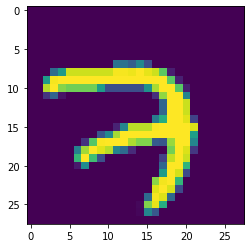

In [2]:
%matplotlib inline

from matplotlib.pyplot import imshow

# Import MNIST data
from tensorflow.examples.tutorials.mnist import input_data
mnist = input_data.read_data_sets("/tmp/data/", one_hot=True)

display(mnist.train.images.shape) # 28*28 = 784

image =mnist.train.images[0].reshape((28,28))
#MNIST data input (img shape: 28*28)
imshow(image)

print(mnist.train.labels[0])

# CNN using Tensorflow




conv_actv_1 max [None, 28, 28, 32]
con1_after max [None, 14, 14, 32]
con2_before max [None, 14, 14, 64]
con2_after max [None, 7, 7, 64]
Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See `tf.nn.softmax_cross_entropy_with_logits_v2`.

started
(64, 784)
(64, 10)
(64, 1024)


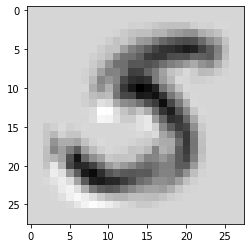

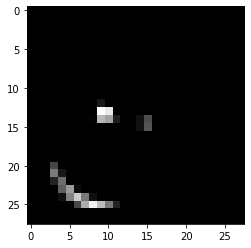

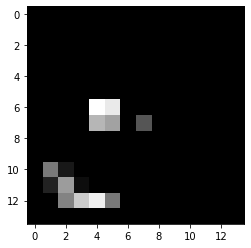

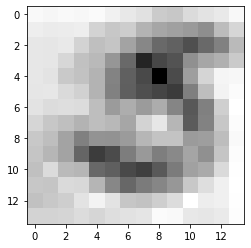

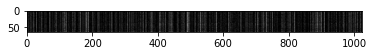

iter:  0 train_cost:  39598.043 train_acc:  0.28125 test_cost:  37424.945 test_acc:  0.1875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 78

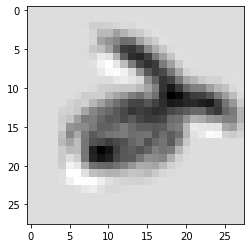

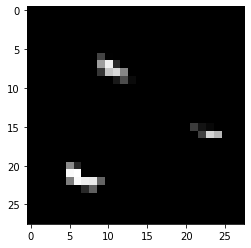

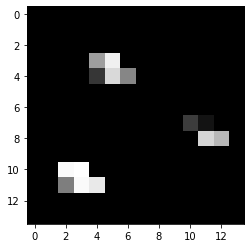

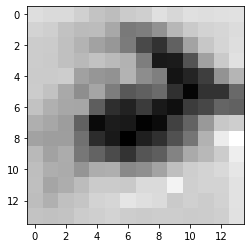

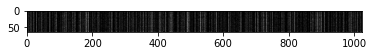

iter:  100 train_cost:  2029.6963 train_acc:  0.859375 test_cost:  2977.1829 test_acc:  0.859375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

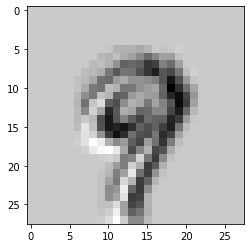

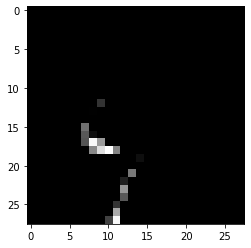

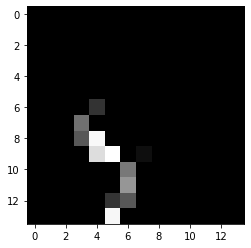

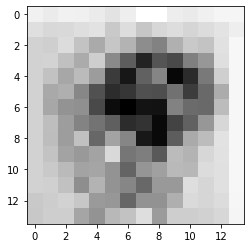

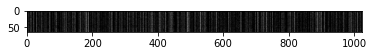

iter:  200 train_cost:  2597.3894 train_acc:  0.875 test_cost:  1642.8708 test_acc:  0.90625 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 7

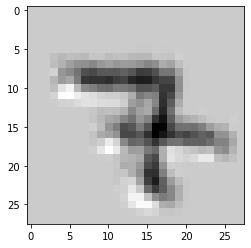

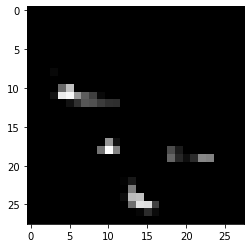

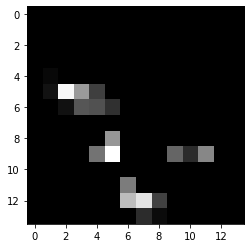

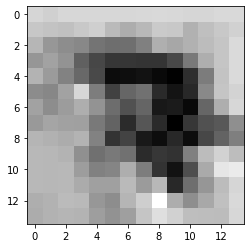

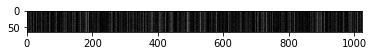

iter:  300 train_cost:  2008.4769 train_acc:  0.890625 test_cost:  1832.6221 test_acc:  0.921875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

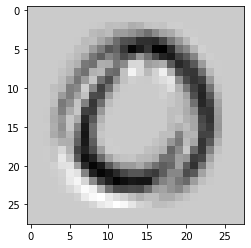

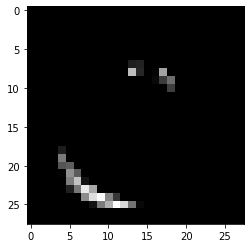

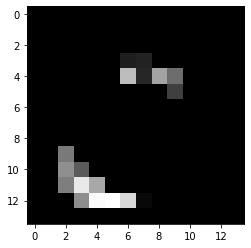

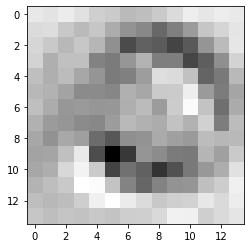

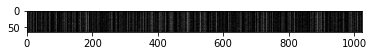

iter:  400 train_cost:  42.591064 train_acc:  0.984375 test_cost:  1280.8384 test_acc:  0.953125 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

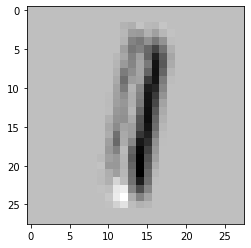

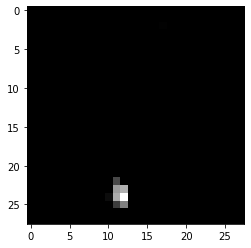

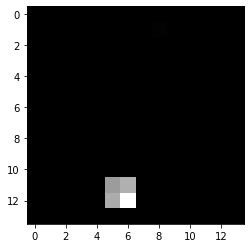

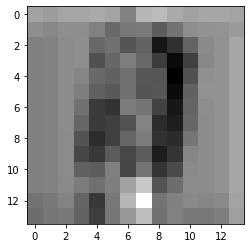

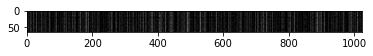

iter:  500 train_cost:  405.75644 train_acc:  0.96875 test_cost:  1802.5422 test_acc:  0.875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 7

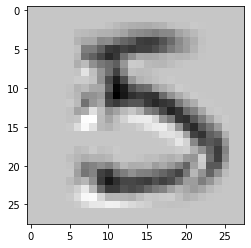

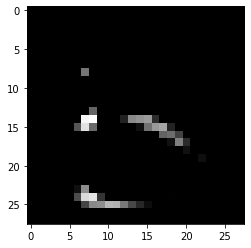

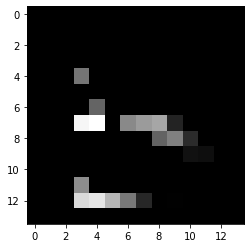

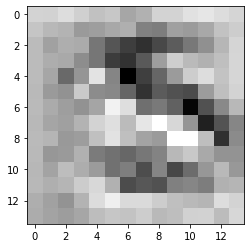

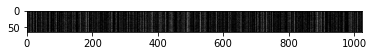

iter:  600 train_cost:  870.4147 train_acc:  0.953125 test_cost:  149.93314 test_acc:  0.953125 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64

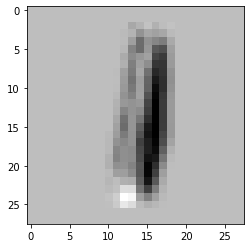

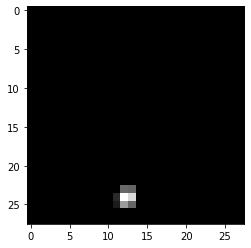

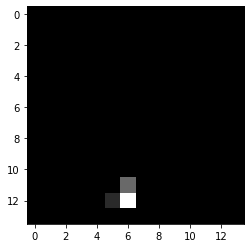

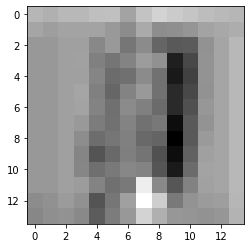

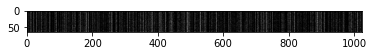

iter:  700 train_cost:  1095.0504 train_acc:  0.921875 test_cost:  401.34152 test_acc:  0.953125 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

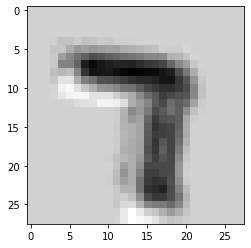

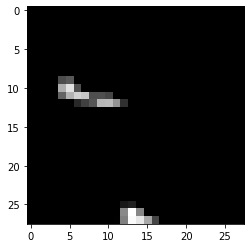

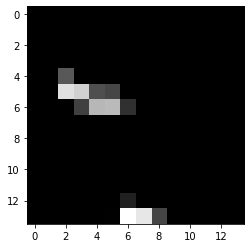

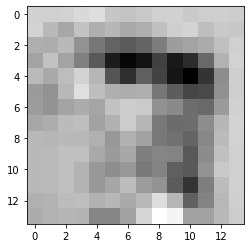

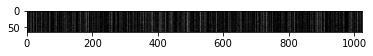

iter:  800 train_cost:  142.59155 train_acc:  0.953125 test_cost:  34.970764 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64

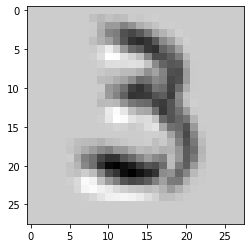

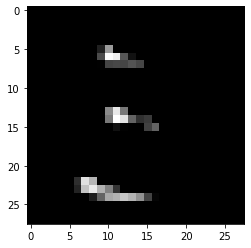

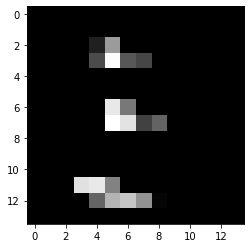

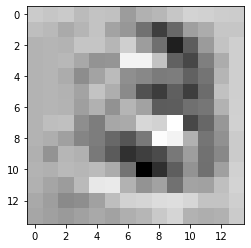

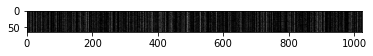

iter:  900 train_cost:  621.2633 train_acc:  0.96875 test_cost:  3.869812 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 

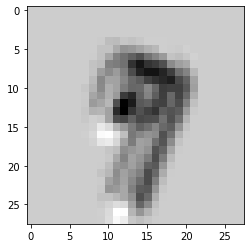

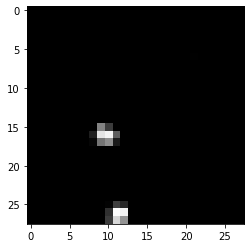

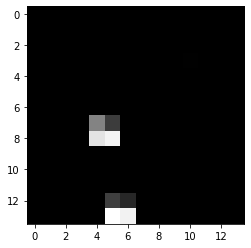

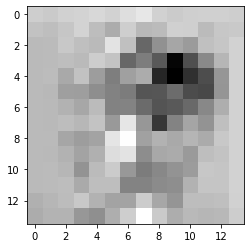

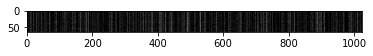

iter:  1000 train_cost:  202.46443 train_acc:  0.984375 test_cost:  554.5463 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64

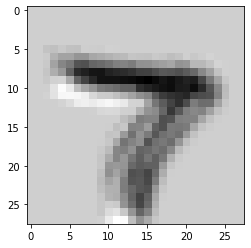

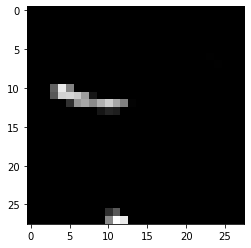

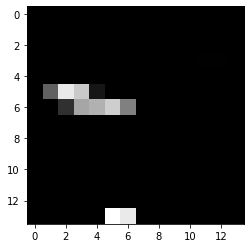

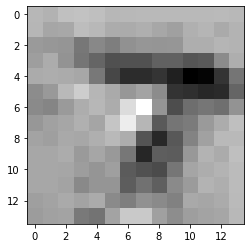

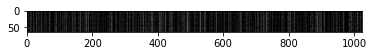

iter:  1100 train_cost:  580.13995 train_acc:  0.96875 test_cost:  103.70795 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

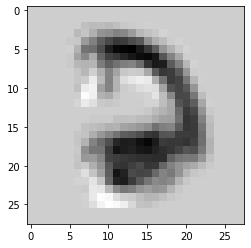

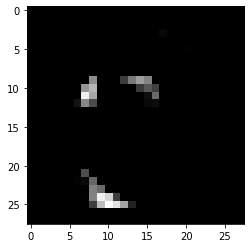

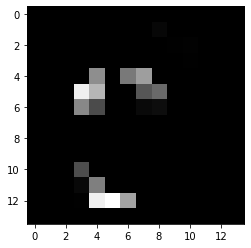

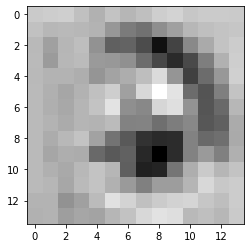

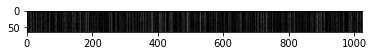

iter:  1200 train_cost:  29.372498 train_acc:  0.984375 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

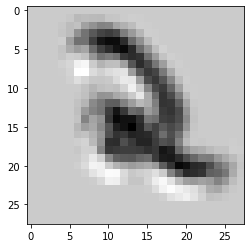

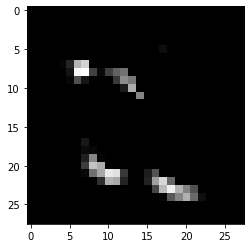

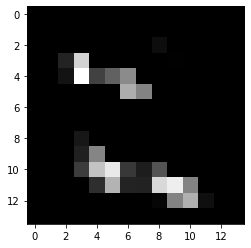

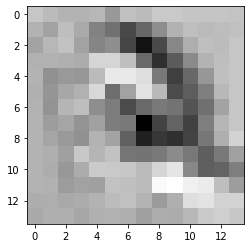

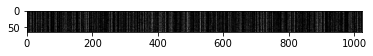

iter:  1300 train_cost:  37.845734 train_acc:  0.984375 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

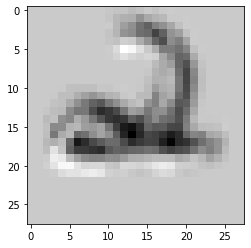

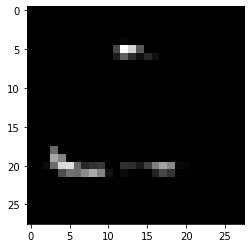

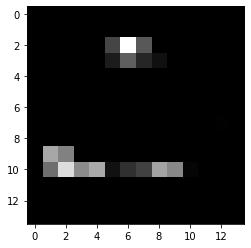

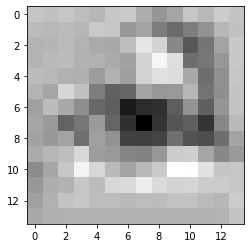

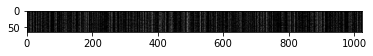

iter:  1400 train_cost:  376.1903 train_acc:  0.953125 test_cost:  35.958313 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

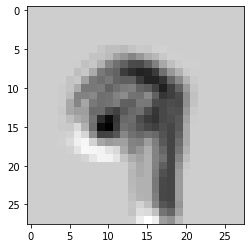

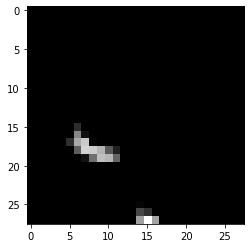

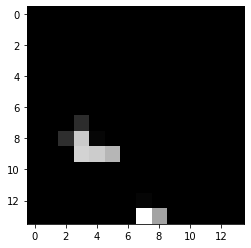

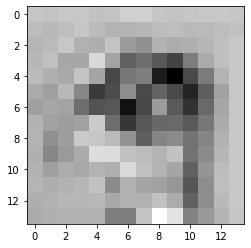

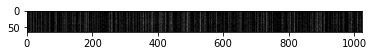

iter:  1500 train_cost:  0.0 train_acc:  1.0 test_cost:  846.3351 test_acc:  0.953125 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

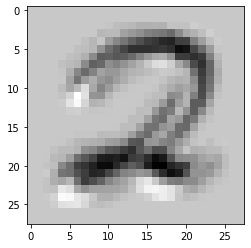

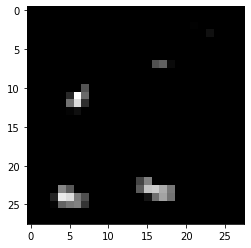

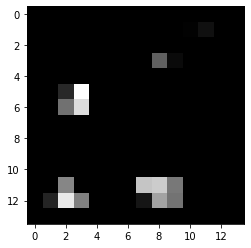

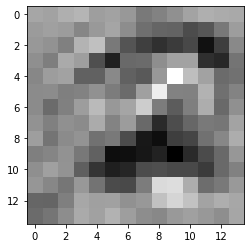

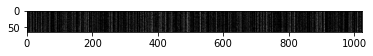

iter:  1600 train_cost:  112.16724 train_acc:  0.984375 test_cost:  0.9042053 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(

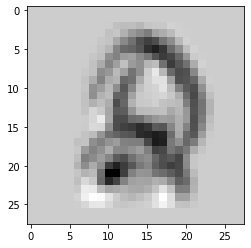

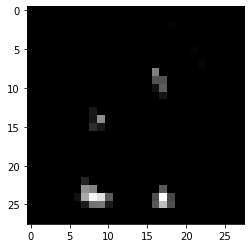

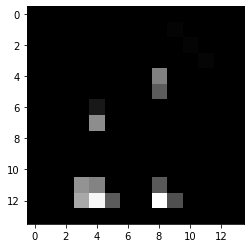

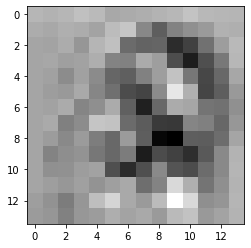

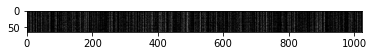

iter:  1700 train_cost:  37.718323 train_acc:  0.984375 test_cost:  568.6857 test_acc:  0.9375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

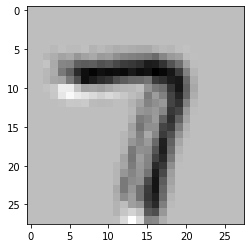

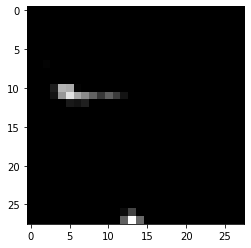

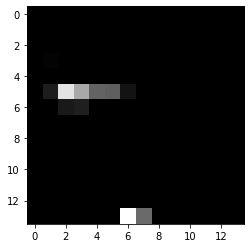

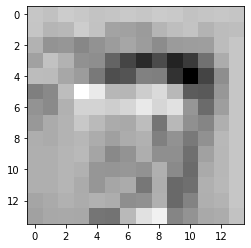

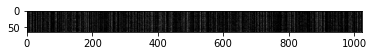

iter:  1800 train_cost:  0.0 train_acc:  1.0 test_cost:  104.555756 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

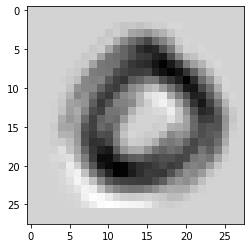

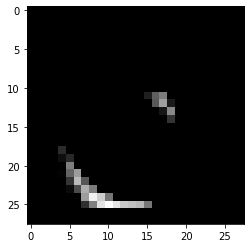

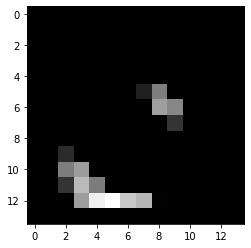

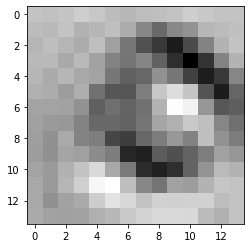

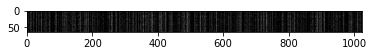

iter:  1900 train_cost:  6.9910583 train_acc:  0.984375 test_cost:  142.899 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64

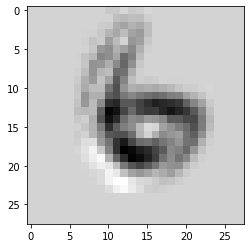

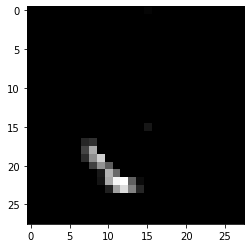

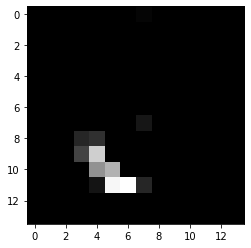

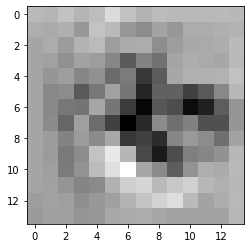

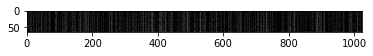

iter:  2000 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

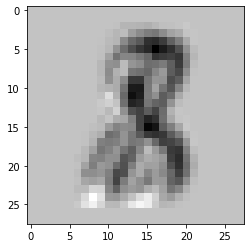

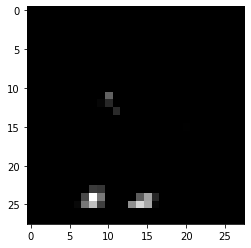

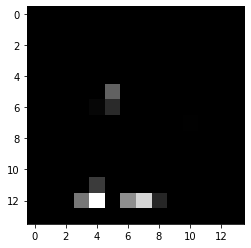

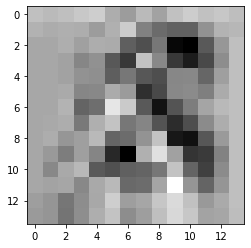

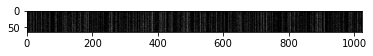

iter:  2100 train_cost:  89.30167 train_acc:  0.953125 test_cost:  508.3363 test_acc:  0.953125 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64

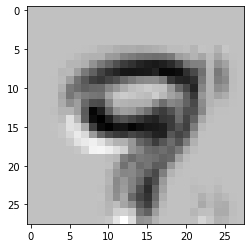

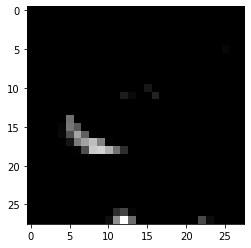

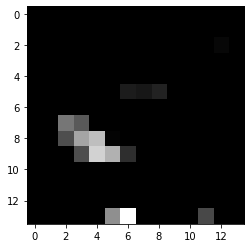

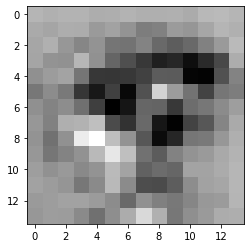

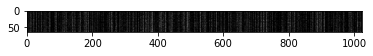

iter:  2200 train_cost:  170.82861 train_acc:  0.953125 test_cost:  322.92432 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

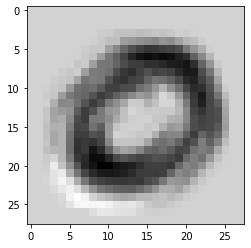

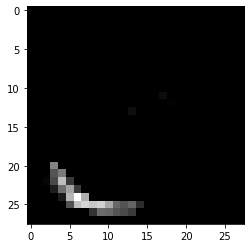

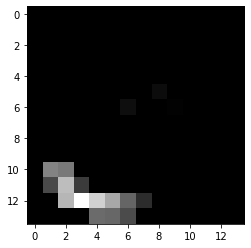

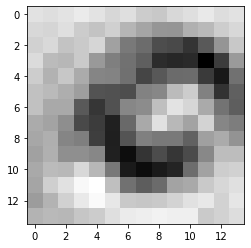

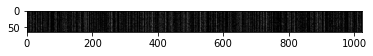

iter:  2300 train_cost:  39.20677 train_acc:  0.984375 test_cost:  756.9497 test_acc:  0.953125 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64

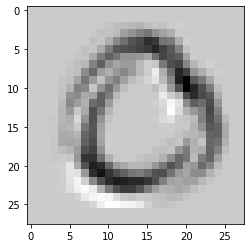

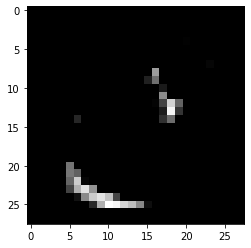

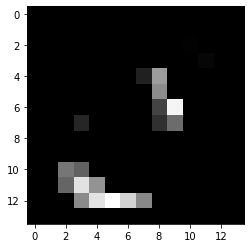

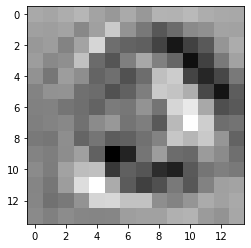

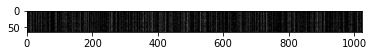

iter:  2400 train_cost:  213.2204 train_acc:  0.96875 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64,

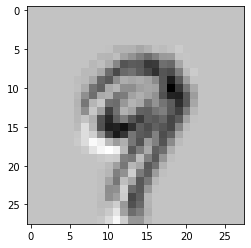

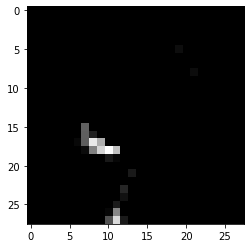

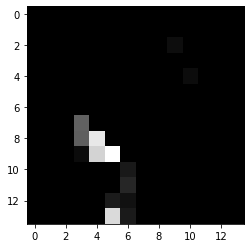

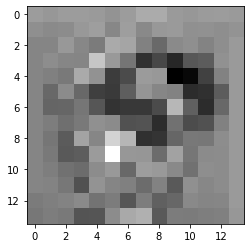

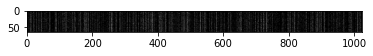

iter:  2500 train_cost:  130.49927 train_acc:  0.953125 test_cost:  221.276 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

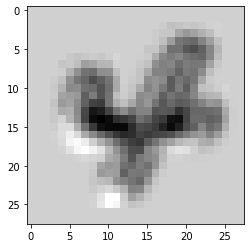

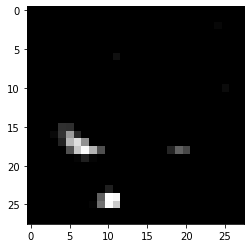

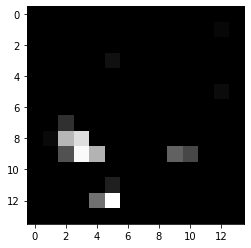

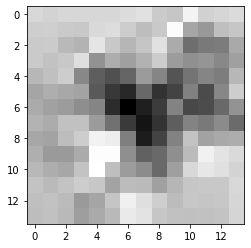

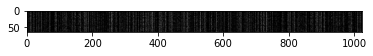

iter:  2600 train_cost:  0.0 train_acc:  1.0 test_cost:  345.28323 test_acc:  0.953125 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

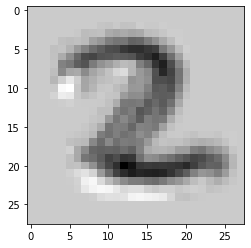

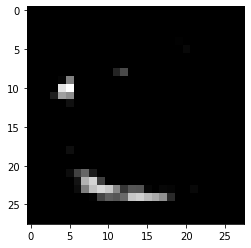

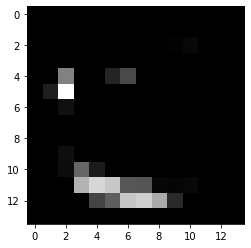

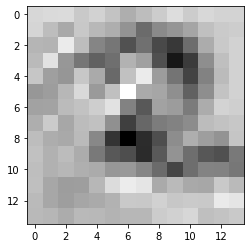

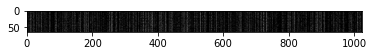

iter:  2700 train_cost:  0.0 train_acc:  1.0 test_cost:  13.334595 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

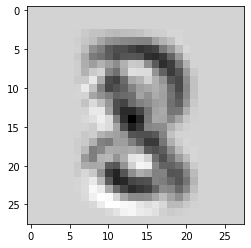

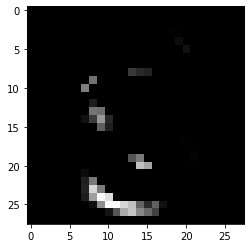

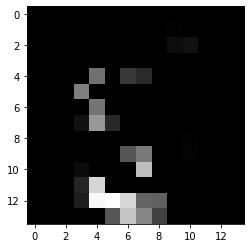

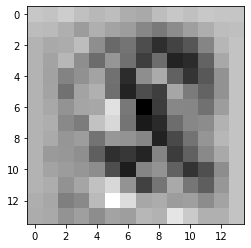

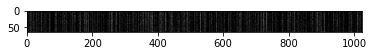

iter:  2800 train_cost:  0.0 train_acc:  1.0 test_cost:  61.16617 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

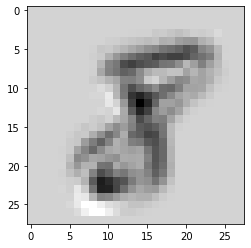

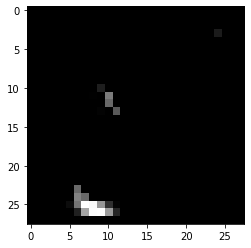

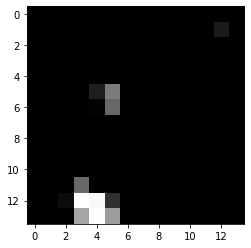

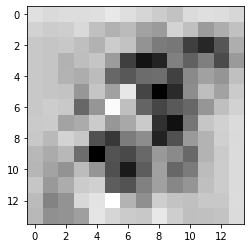

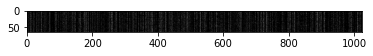

iter:  2900 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

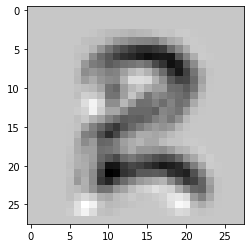

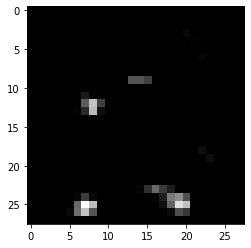

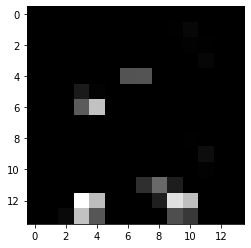

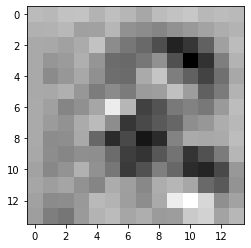

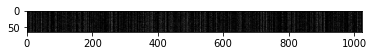

iter:  3000 train_cost:  4.197571 train_acc:  0.984375 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

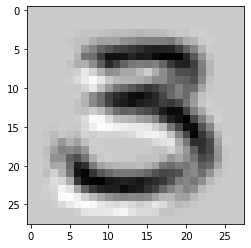

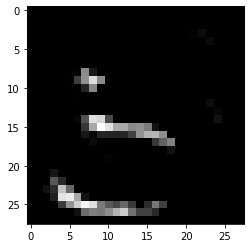

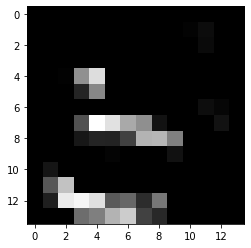

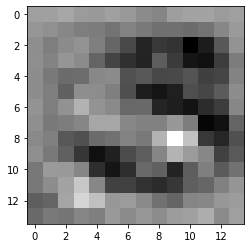

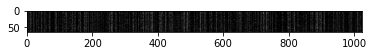

iter:  3100 train_cost:  166.87975 train_acc:  0.984375 test_cost:  120.32791 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(

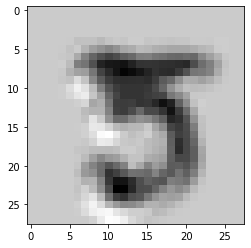

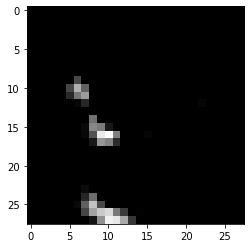

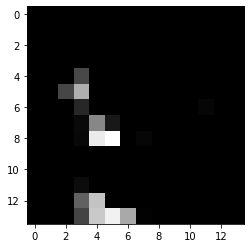

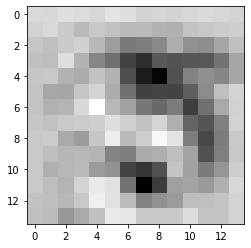

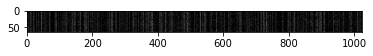

iter:  3200 train_cost:  105.91336 train_acc:  0.953125 test_cost:  174.41156 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(

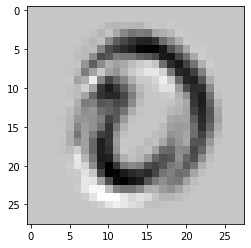

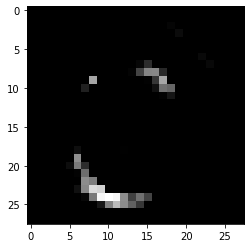

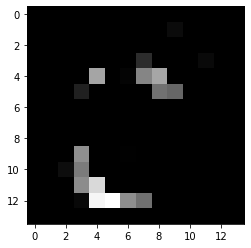

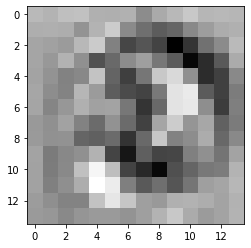

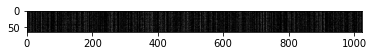

iter:  3300 train_cost:  189.33154 train_acc:  0.953125 test_cost:  68.490814 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(

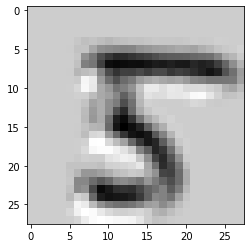

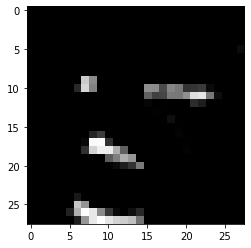

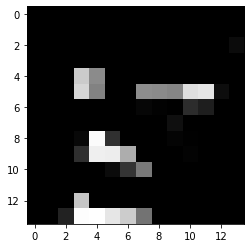

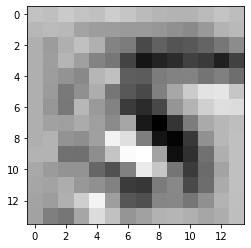

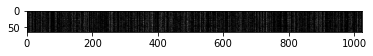

iter:  3400 train_cost:  0.0 train_acc:  1.0 test_cost:  636.65796 test_acc:  0.9375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64,

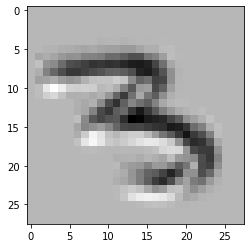

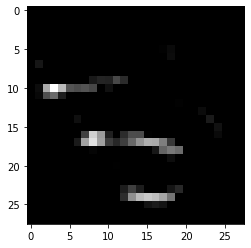

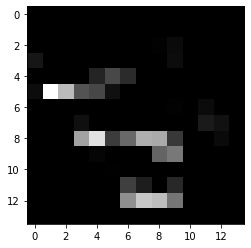

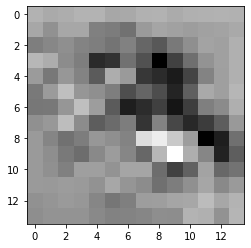

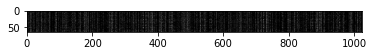

iter:  3500 train_cost:  383.43756 train_acc:  0.984375 test_cost:  389.6061 test_acc:  0.9375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

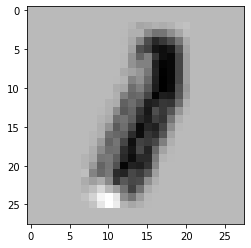

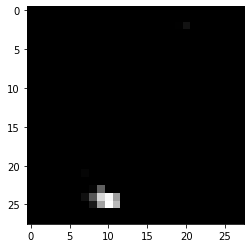

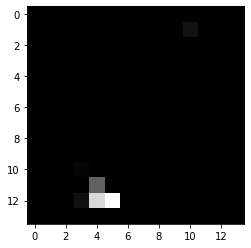

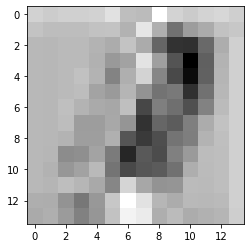

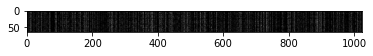

iter:  3600 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

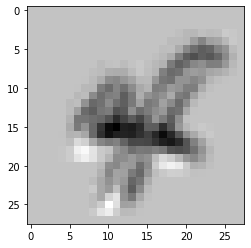

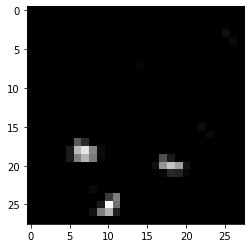

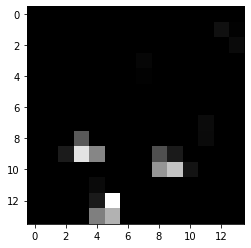

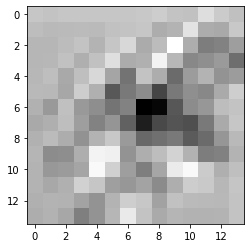

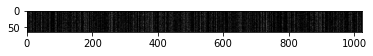

iter:  3700 train_cost:  0.0 train_acc:  1.0 test_cost:  40.165085 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

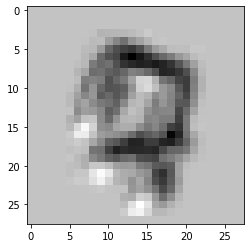

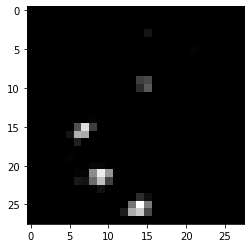

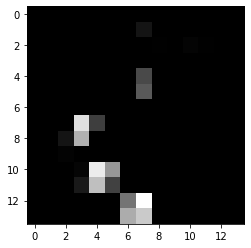

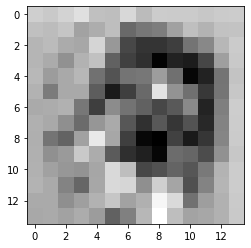

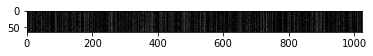

iter:  3800 train_cost:  0.0 train_acc:  1.0 test_cost:  126.849365 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

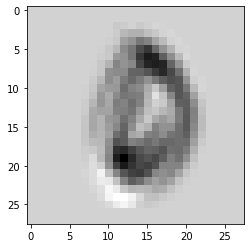

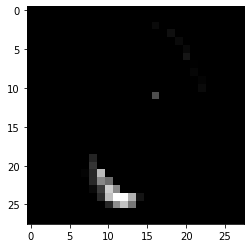

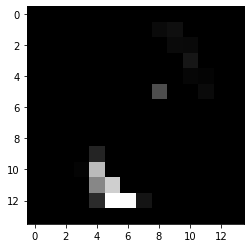

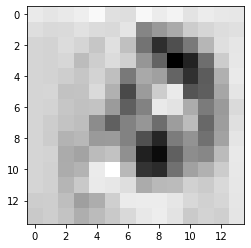

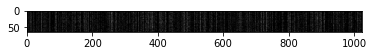

iter:  3900 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

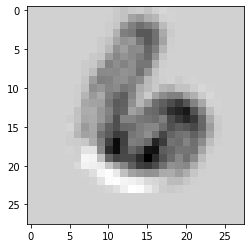

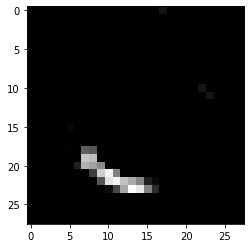

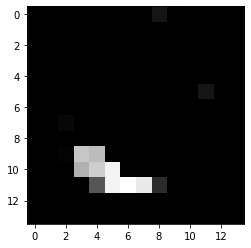

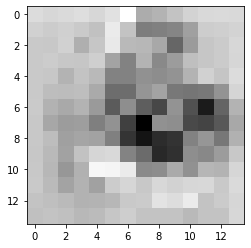

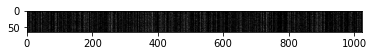

iter:  4000 train_cost:  113.50134 train_acc:  0.96875 test_cost:  225.58409 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

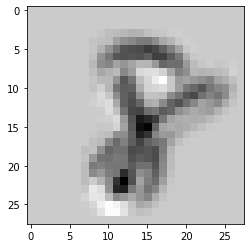

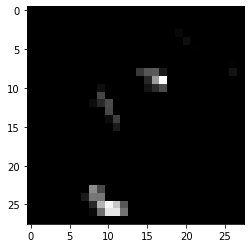

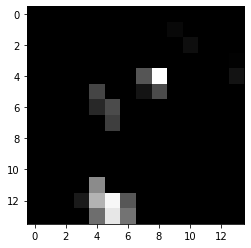

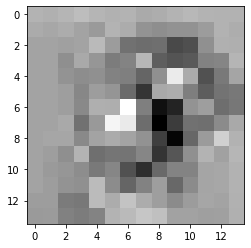

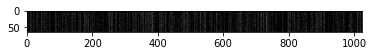

iter:  4100 train_cost:  144.5451 train_acc:  0.984375 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

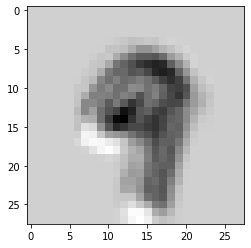

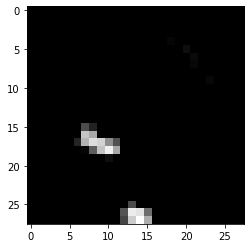

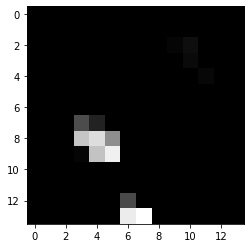

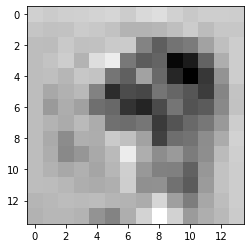

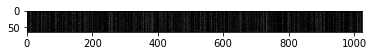

iter:  4200 train_cost:  2.5189667 train_acc:  0.96875 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

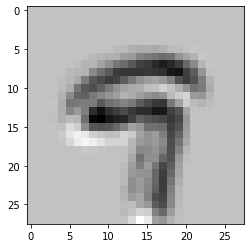

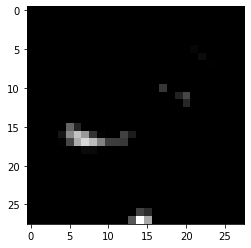

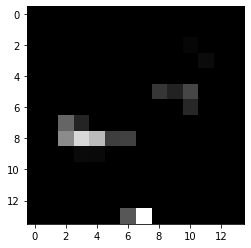

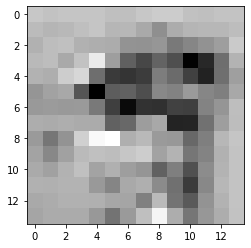

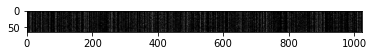

iter:  4300 train_cost:  19.663147 train_acc:  0.984375 test_cost:  45.23236 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

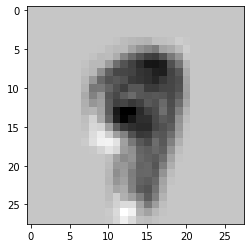

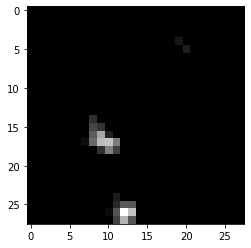

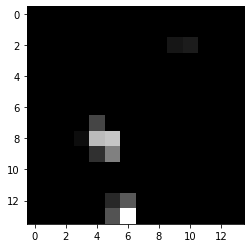

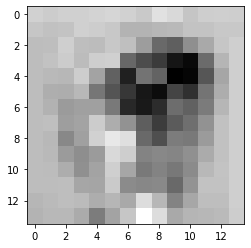

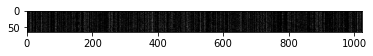

iter:  4400 train_cost:  0.0 train_acc:  1.0 test_cost:  48.1091 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64,

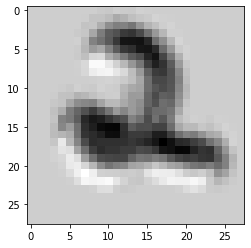

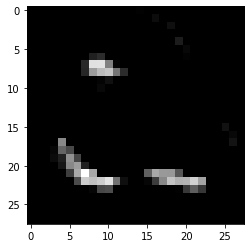

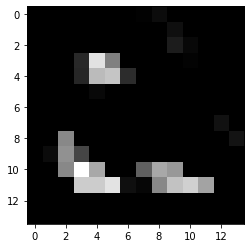

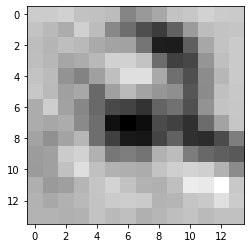

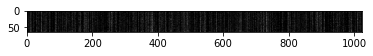

iter:  4500 train_cost:  0.0 train_acc:  1.0 test_cost:  22.998627 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

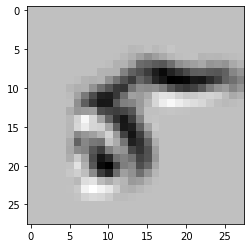

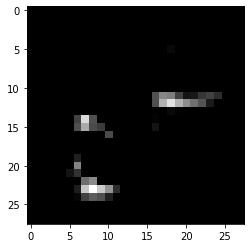

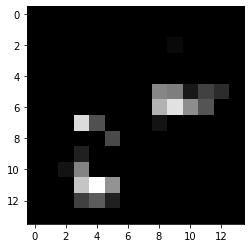

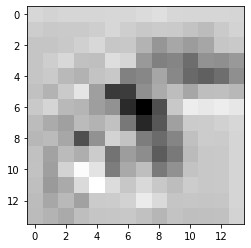

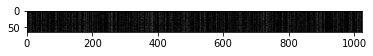

iter:  4600 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

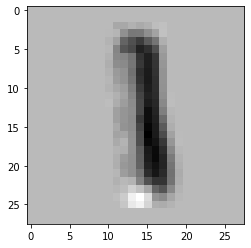

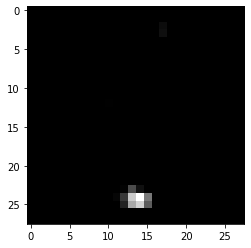

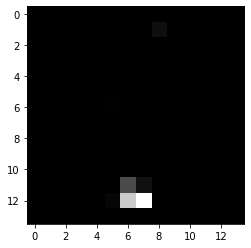

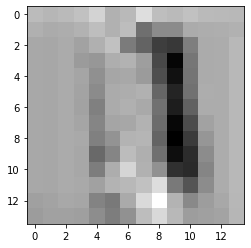

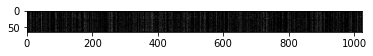

iter:  4700 train_cost:  0.0 train_acc:  1.0 test_cost:  276.44553 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

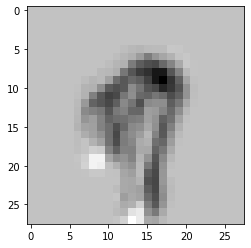

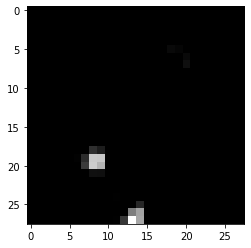

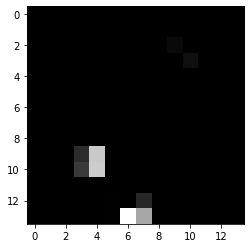

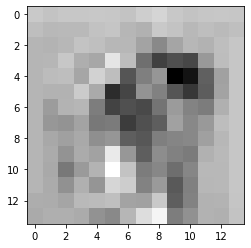

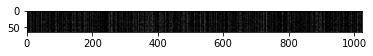

iter:  4800 train_cost:  193.08565 train_acc:  0.984375 test_cost:  262.12933 test_acc:  0.921875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(

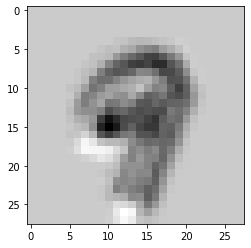

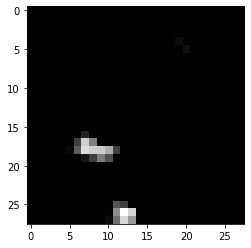

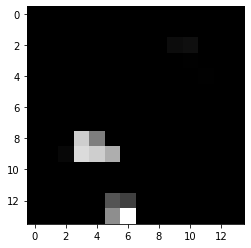

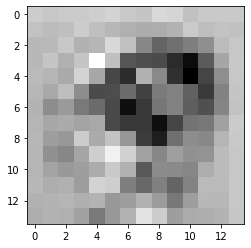

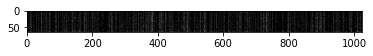

iter:  4900 train_cost:  94.93323 train_acc:  0.984375 test_cost:  615.58057 test_acc:  0.953125 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

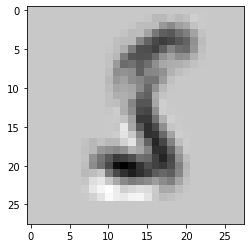

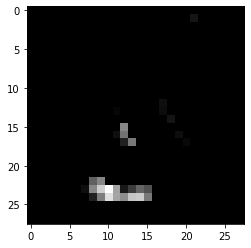

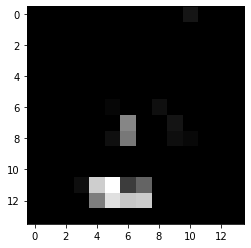

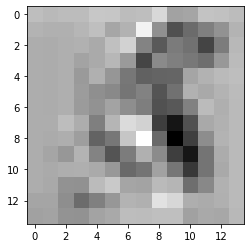

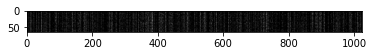

iter:  5000 train_cost:  0.0 train_acc:  1.0 test_cost:  33.01818 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

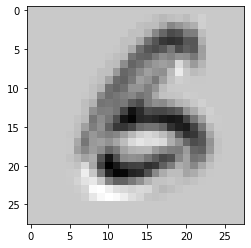

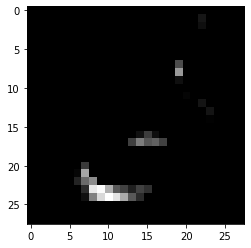

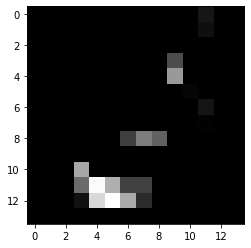

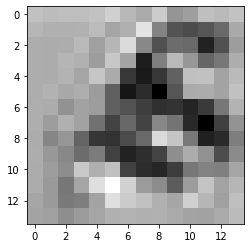

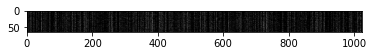

iter:  5100 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

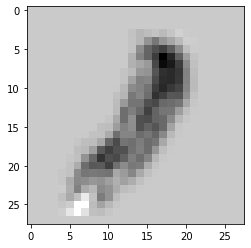

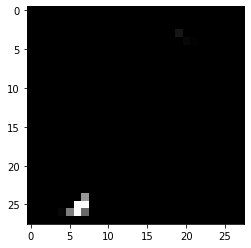

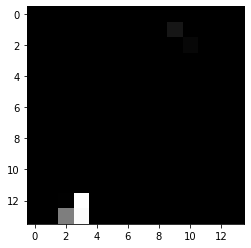

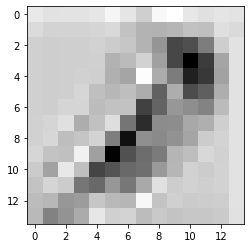

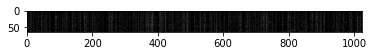

iter:  5200 train_cost:  0.0 train_acc:  1.0 test_cost:  310.1048 test_acc:  0.9375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 

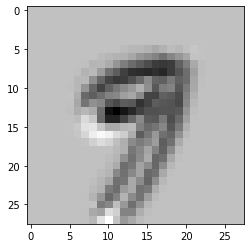

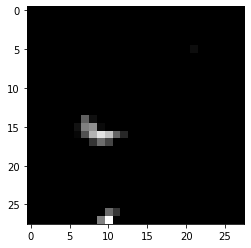

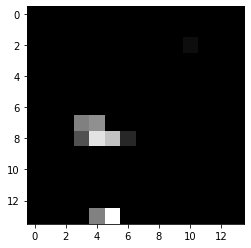

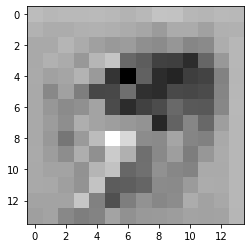

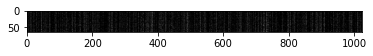

iter:  5300 train_cost:  27.78508 train_acc:  0.984375 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

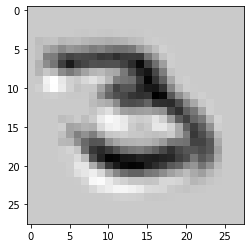

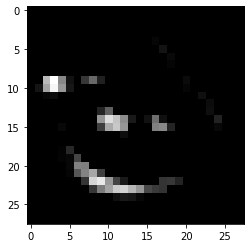

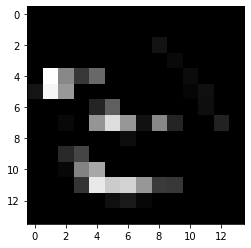

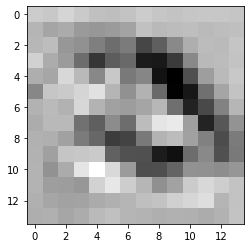

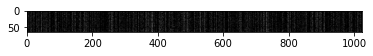

iter:  5400 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

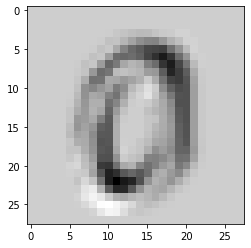

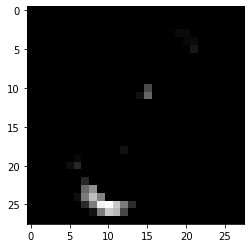

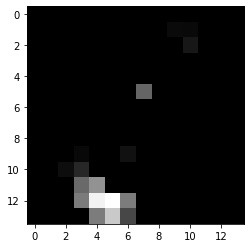

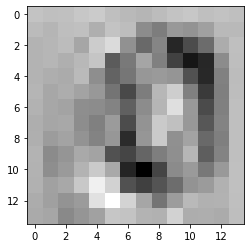

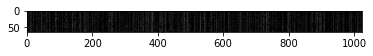

iter:  5500 train_cost:  0.0 train_acc:  1.0 test_cost:  141.00687 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

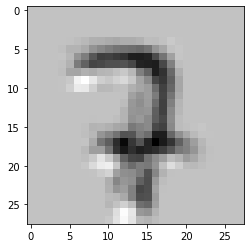

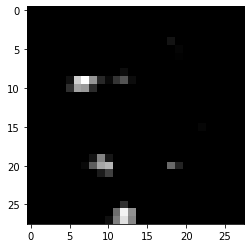

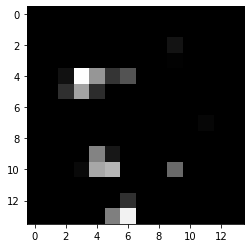

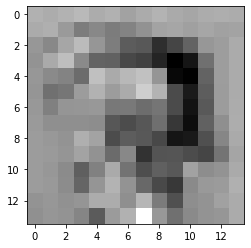

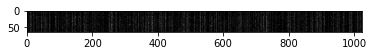

iter:  5600 train_cost:  0.0 train_acc:  1.0 test_cost:  9.898376 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

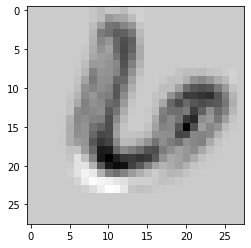

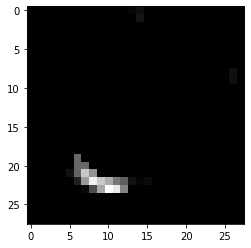

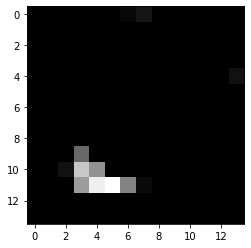

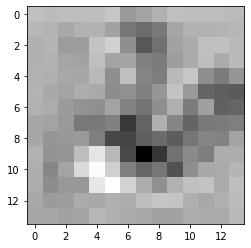

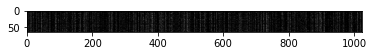

iter:  5700 train_cost:  0.0 train_acc:  1.0 test_cost:  80.3591 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 

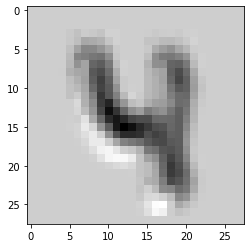

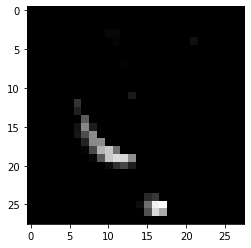

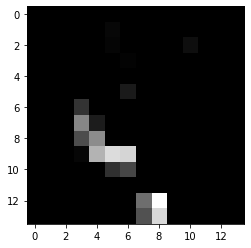

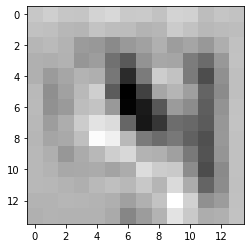

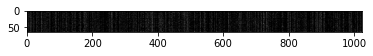

iter:  5800 train_cost:  0.0 train_acc:  1.0 test_cost:  201.58716 test_acc:  0.953125 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

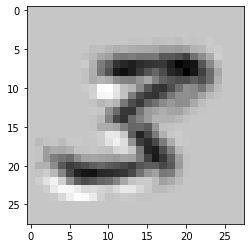

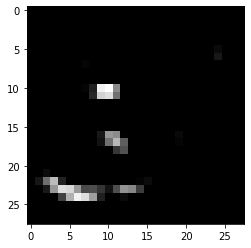

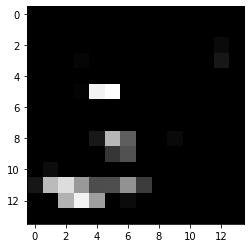

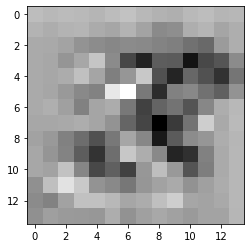

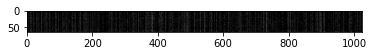

iter:  5900 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

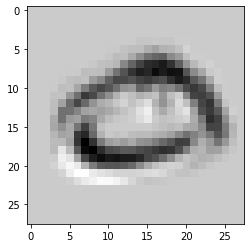

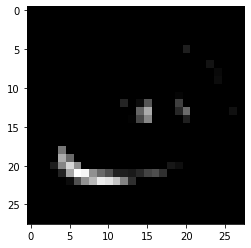

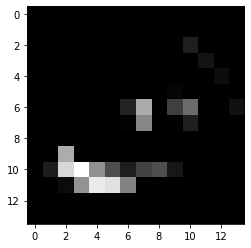

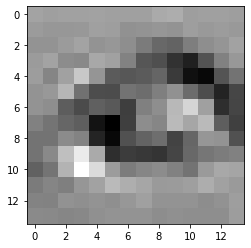

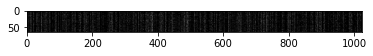

iter:  6000 train_cost:  0.0 train_acc:  1.0 test_cost:  106.28606 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

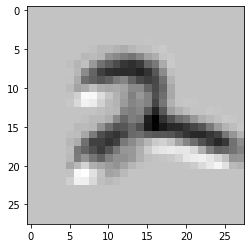

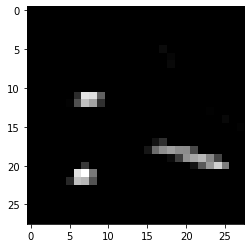

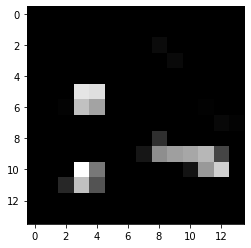

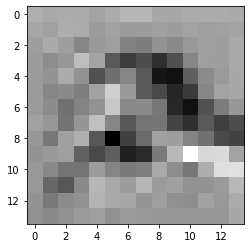

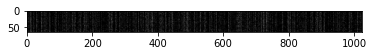

iter:  6100 train_cost:  0.0 train_acc:  1.0 test_cost:  234.36505 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

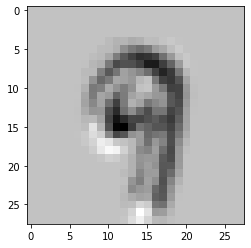

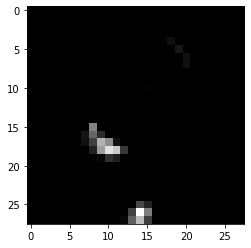

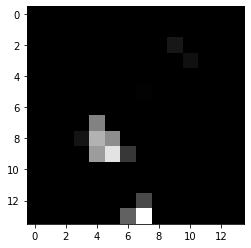

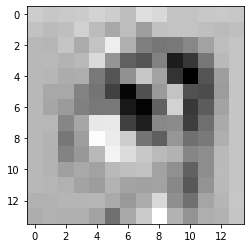

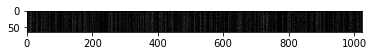

iter:  6200 train_cost:  0.0 train_acc:  1.0 test_cost:  69.47826 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

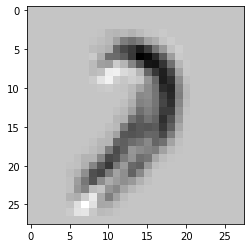

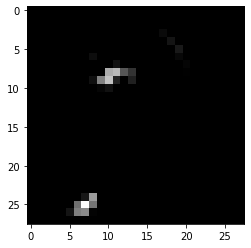

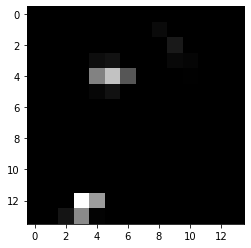

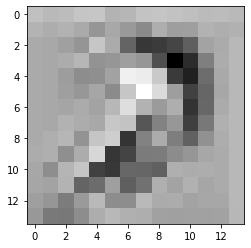

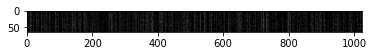

iter:  6300 train_cost:  0.0 train_acc:  1.0 test_cost:  35.019897 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

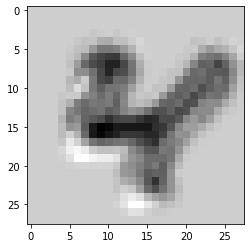

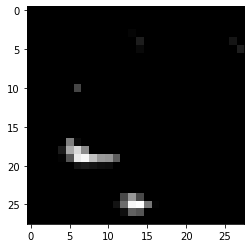

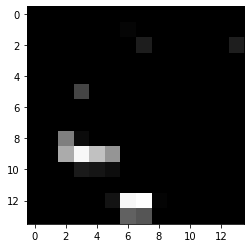

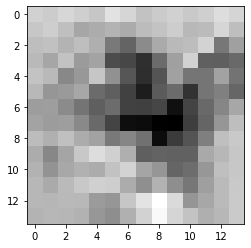

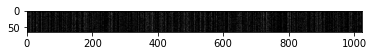

iter:  6400 train_cost:  0.0 train_acc:  1.0 test_cost:  108.3345 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

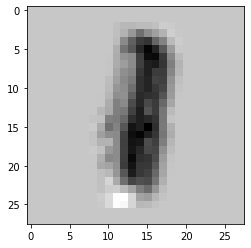

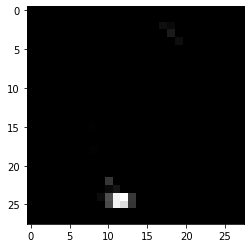

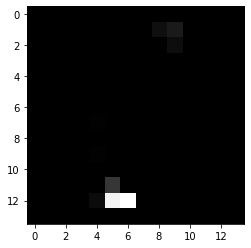

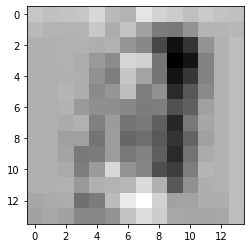

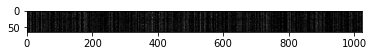

iter:  6500 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

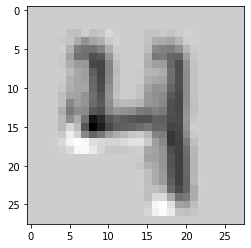

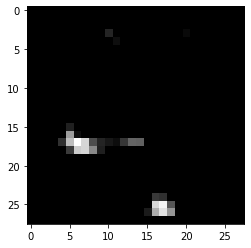

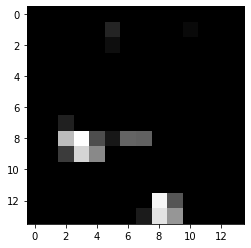

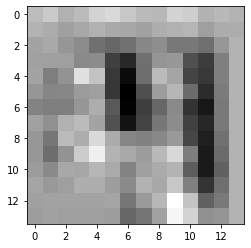

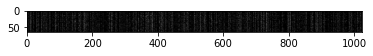

iter:  6600 train_cost:  0.0 train_acc:  1.0 test_cost:  330.37665 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

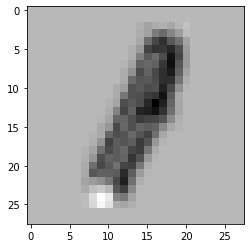

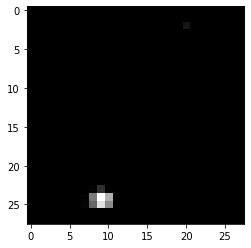

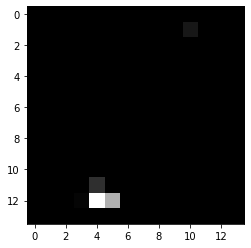

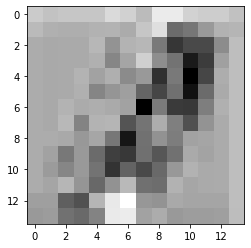

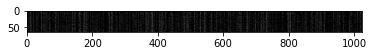

iter:  6700 train_cost:  0.0 train_acc:  1.0 test_cost:  125.35951 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

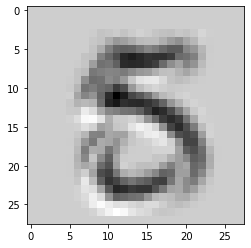

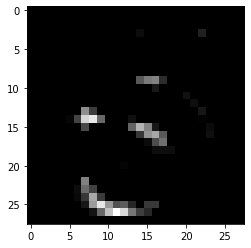

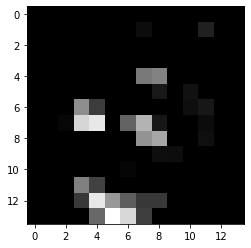

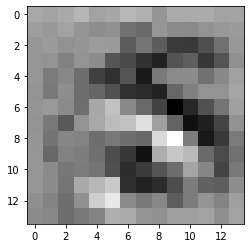

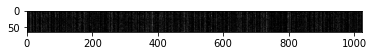

iter:  6800 train_cost:  0.0 train_acc:  1.0 test_cost:  201.52498 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

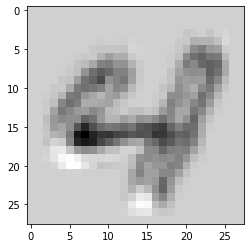

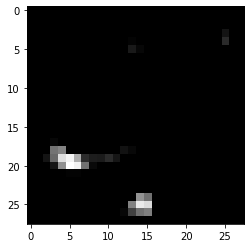

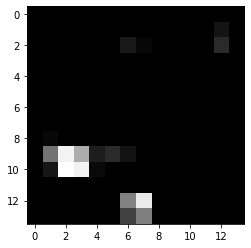

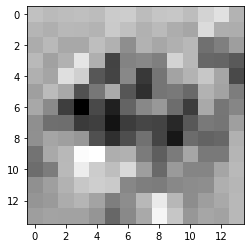

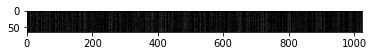

iter:  6900 train_cost:  0.0 train_acc:  1.0 test_cost:  129.20204 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

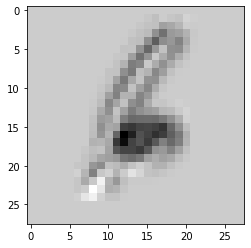

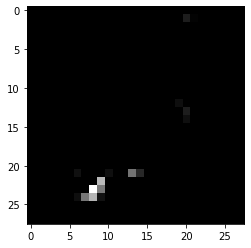

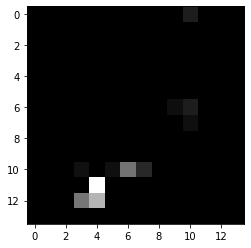

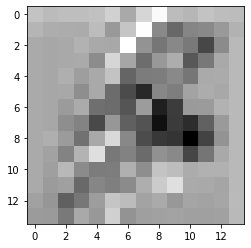

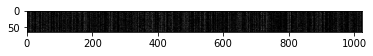

iter:  7000 train_cost:  0.0 train_acc:  1.0 test_cost:  131.37431 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

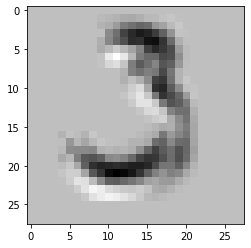

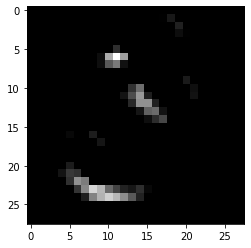

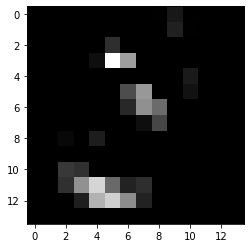

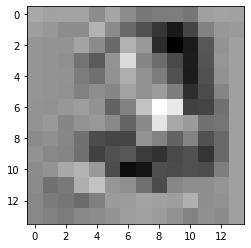

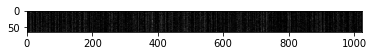

iter:  7100 train_cost:  14.28511 train_acc:  0.984375 test_cost:  133.01486 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(6

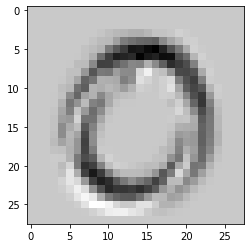

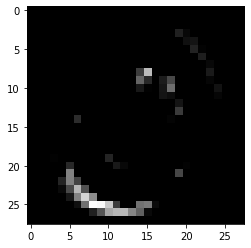

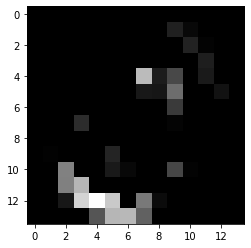

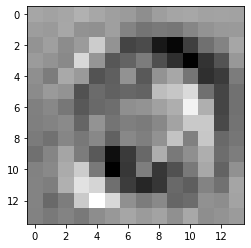

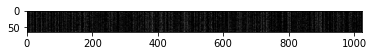

iter:  7200 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

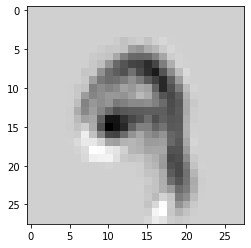

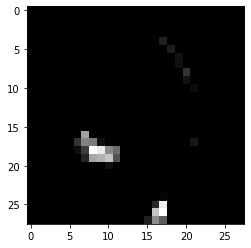

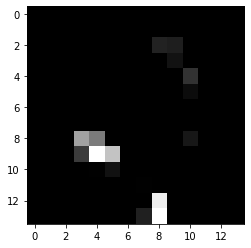

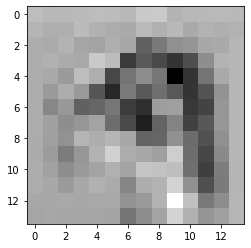

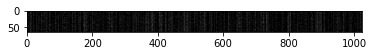

iter:  7300 train_cost:  0.0 train_acc:  1.0 test_cost:  211.39311 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

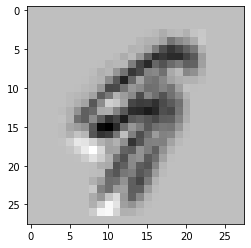

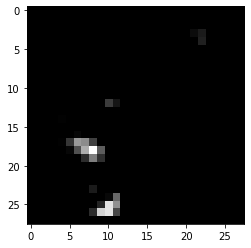

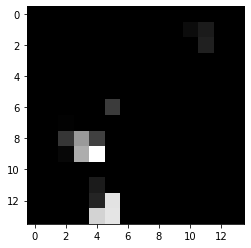

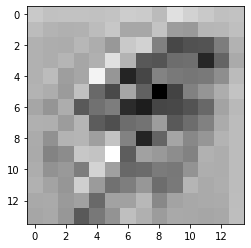

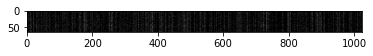

iter:  7400 train_cost:  0.0 train_acc:  1.0 test_cost:  173.9763 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64,

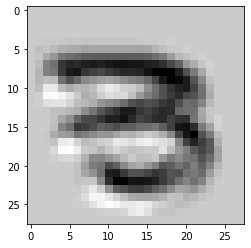

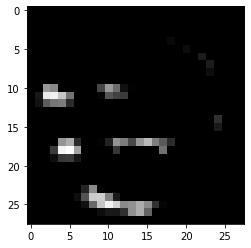

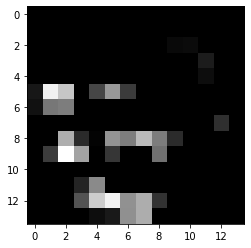

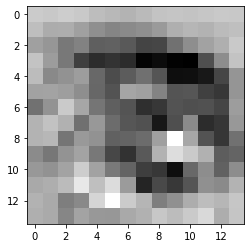

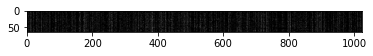

iter:  7500 train_cost:  0.0 train_acc:  1.0 test_cost:  222.6131 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

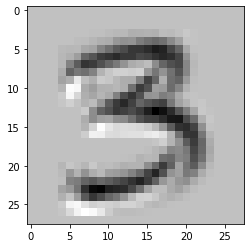

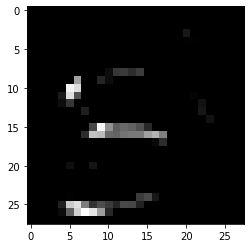

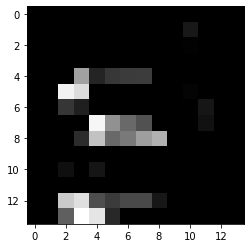

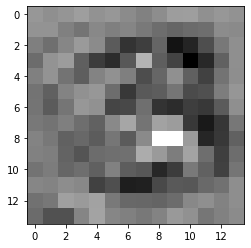

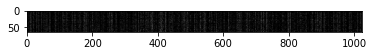

iter:  7600 train_cost:  0.0 train_acc:  1.0 test_cost:  36.605927 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

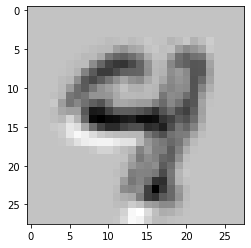

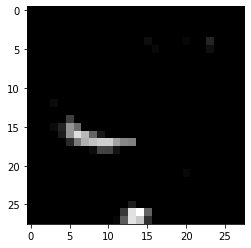

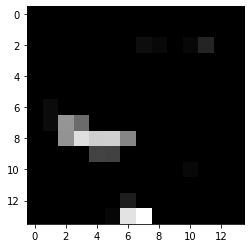

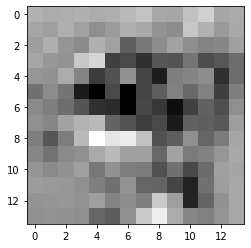

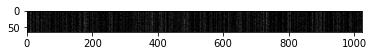

iter:  7700 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

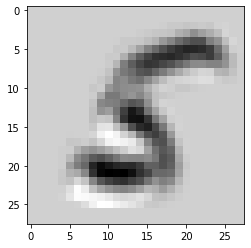

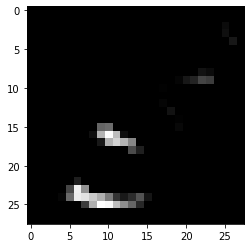

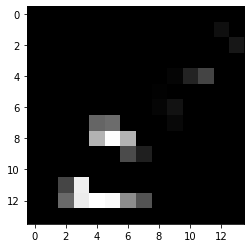

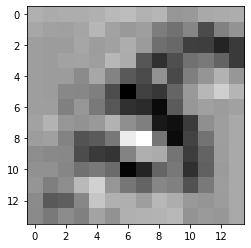

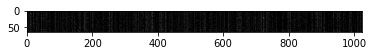

iter:  7800 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

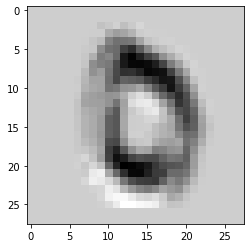

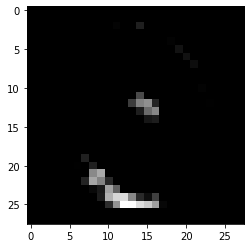

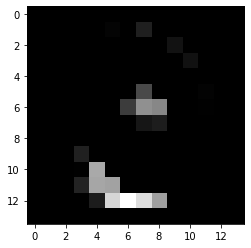

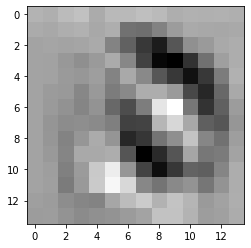

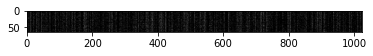

iter:  7900 train_cost:  0.0 train_acc:  1.0 test_cost:  219.48755 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

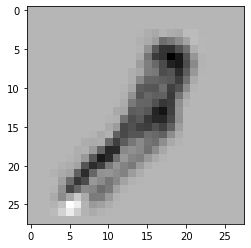

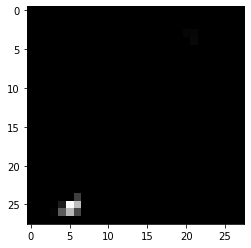

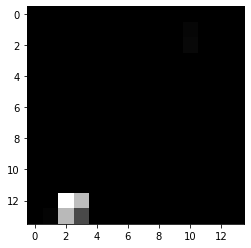

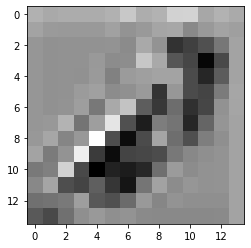

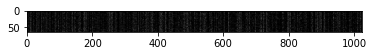

iter:  8000 train_cost:  0.0 train_acc:  1.0 test_cost:  74.790375 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

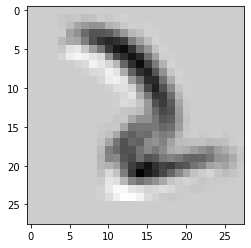

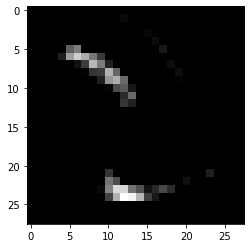

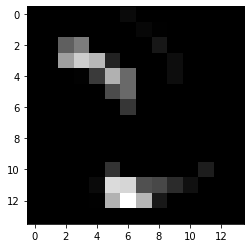

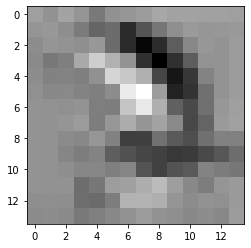

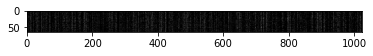

iter:  8100 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

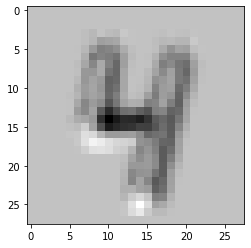

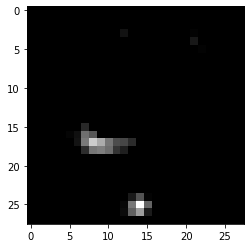

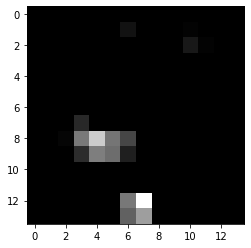

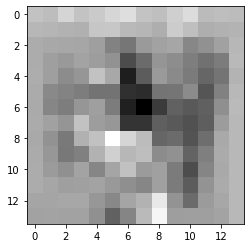

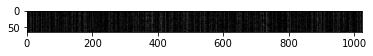

iter:  8200 train_cost:  0.0 train_acc:  1.0 test_cost:  199.96666 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

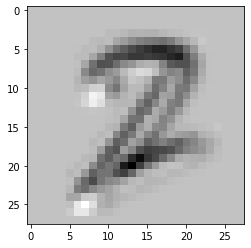

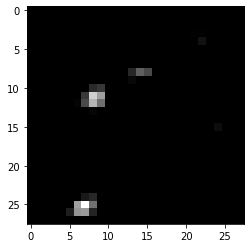

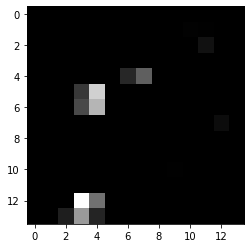

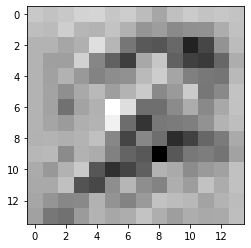

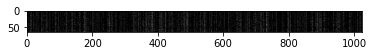

iter:  8300 train_cost:  0.0 train_acc:  1.0 test_cost:  108.05705 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

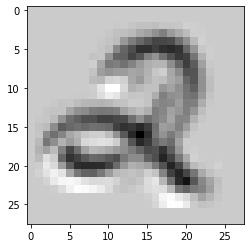

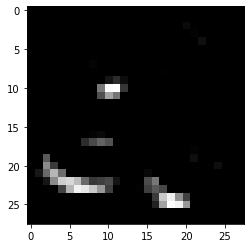

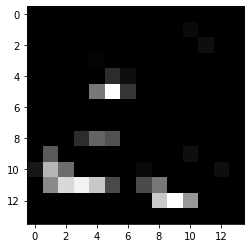

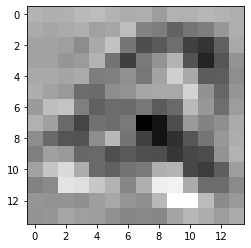

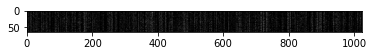

iter:  8400 train_cost:  0.0 train_acc:  1.0 test_cost:  41.997833 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

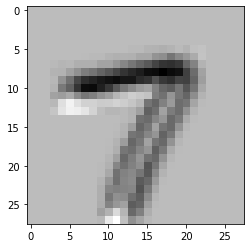

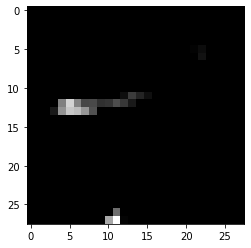

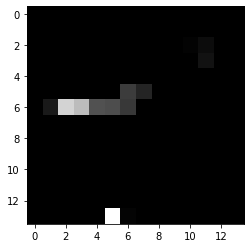

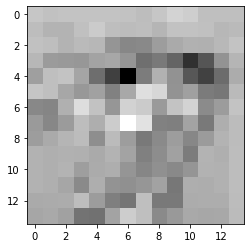

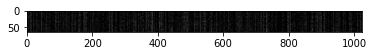

iter:  8500 train_cost:  0.0 train_acc:  1.0 test_cost:  249.74915 test_acc:  0.953125 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

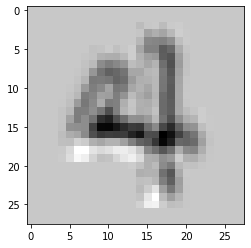

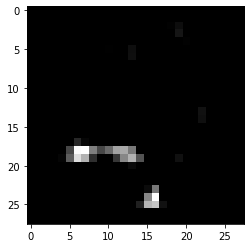

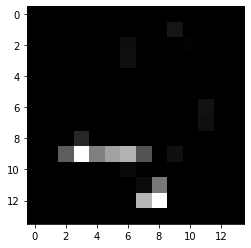

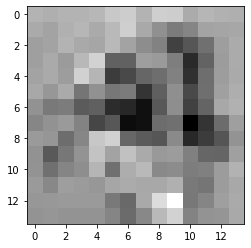

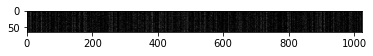

iter:  8600 train_cost:  0.0 train_acc:  1.0 test_cost:  114.97763 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

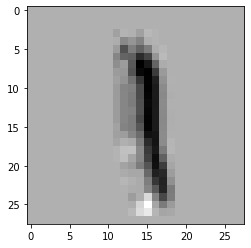

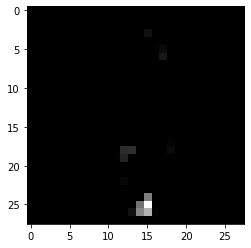

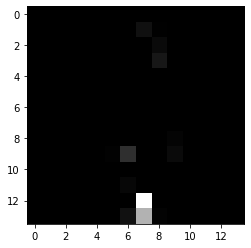

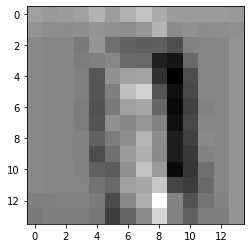

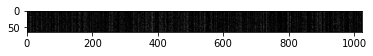

iter:  8700 train_cost:  0.7503967 train_acc:  0.984375 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

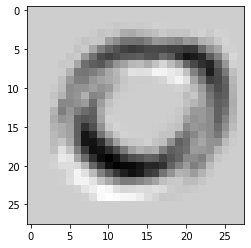

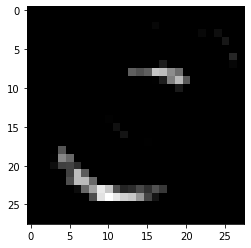

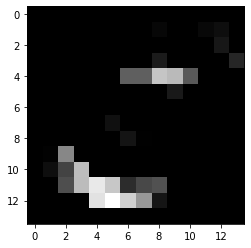

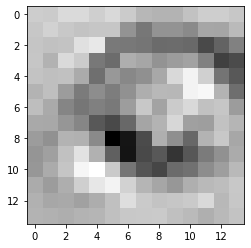

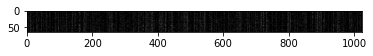

iter:  8800 train_cost:  0.0 train_acc:  1.0 test_cost:  44.532867 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

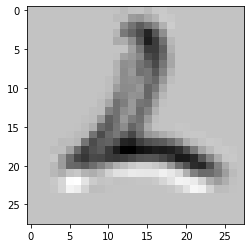

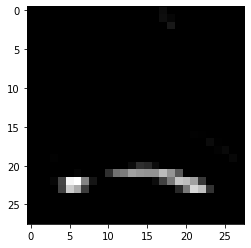

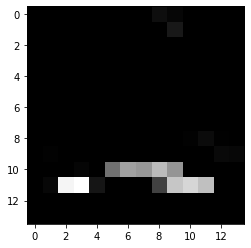

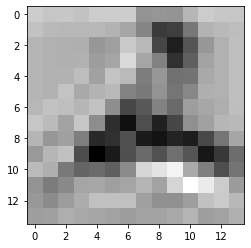

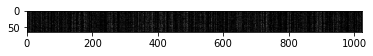

iter:  8900 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

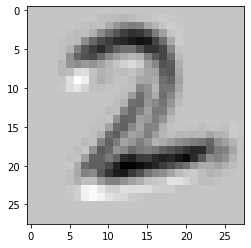

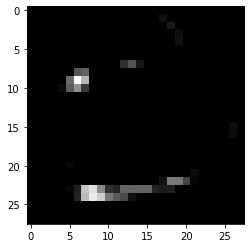

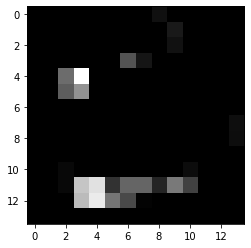

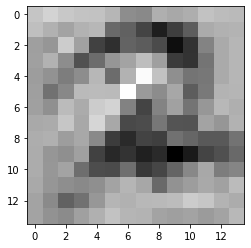

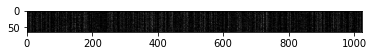

iter:  9000 train_cost:  0.0 train_acc:  1.0 test_cost:  358.96582 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

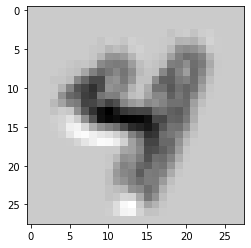

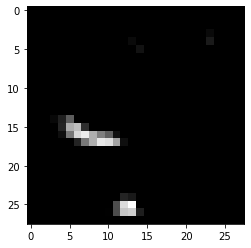

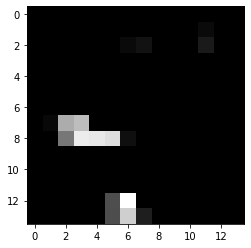

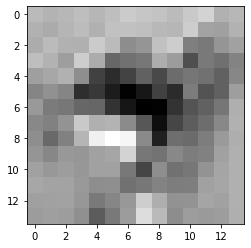

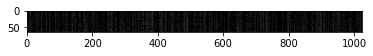

iter:  9100 train_cost:  0.0 train_acc:  1.0 test_cost:  219.3073 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64,

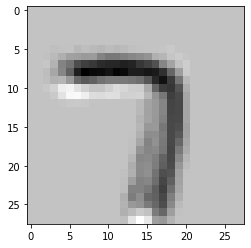

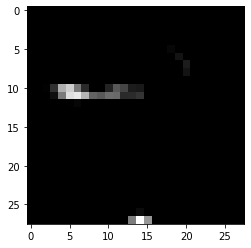

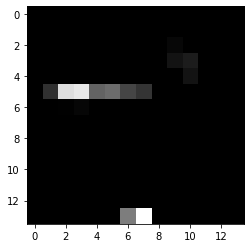

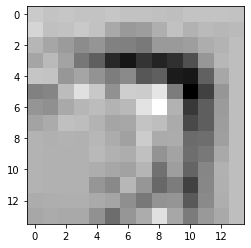

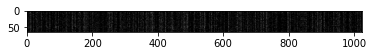

iter:  9200 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

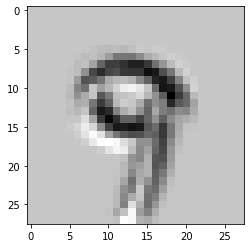

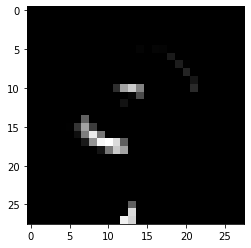

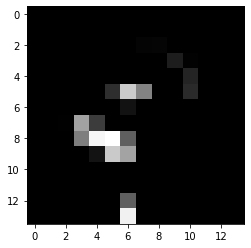

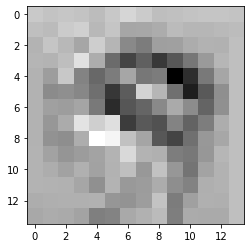

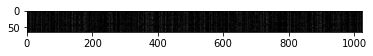

iter:  9300 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

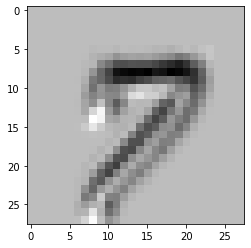

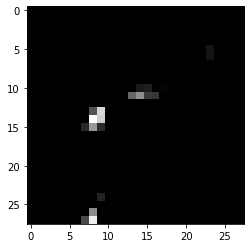

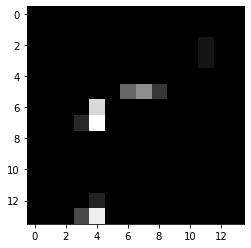

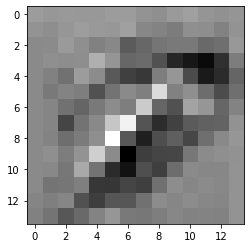

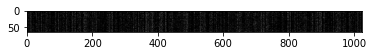

iter:  9400 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

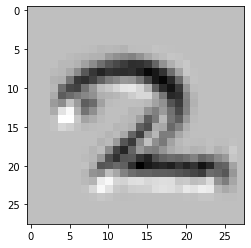

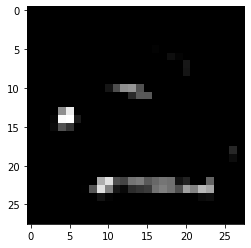

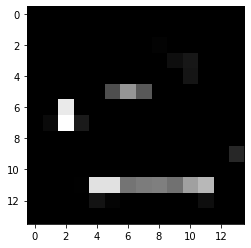

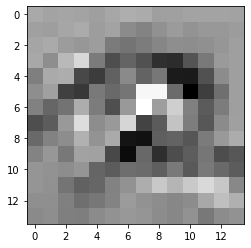

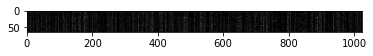

iter:  9500 train_cost:  0.0 train_acc:  1.0 test_cost:  0.0 test_acc:  1.0 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64,

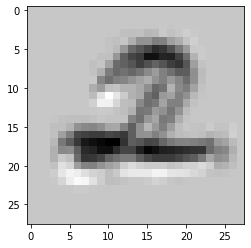

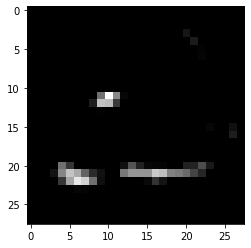

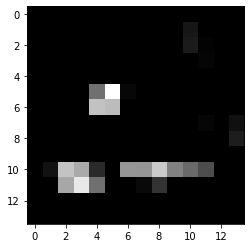

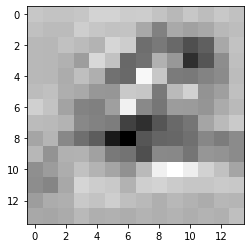

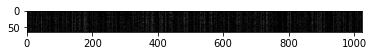

iter:  9600 train_cost:  0.0 train_acc:  1.0 test_cost:  23.290894 test_acc:  0.96875 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

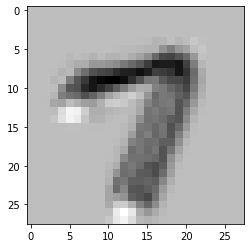

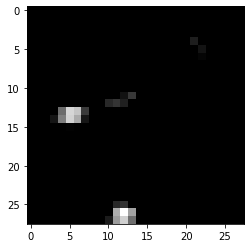

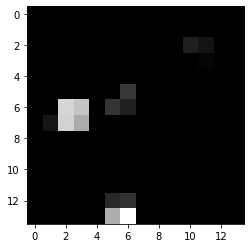

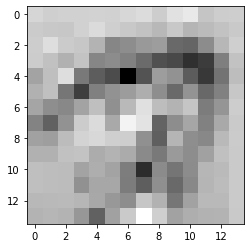

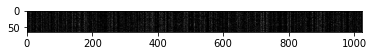

iter:  9700 train_cost:  0.0 train_acc:  1.0 test_cost:  86.72485 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64

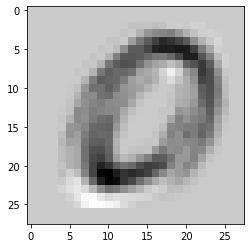

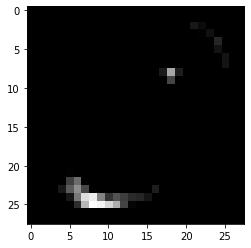

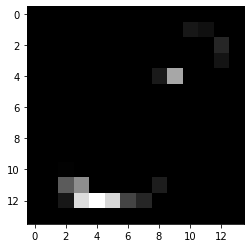

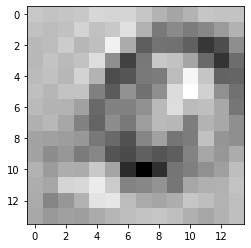

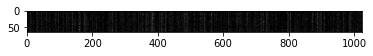

iter:  9800 train_cost:  0.0 train_acc:  1.0 test_cost:  37.045288 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

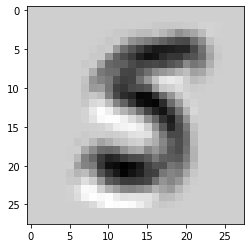

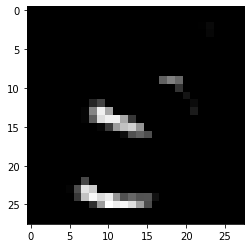

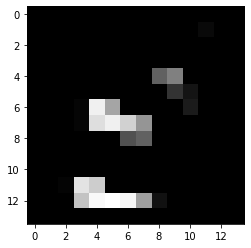

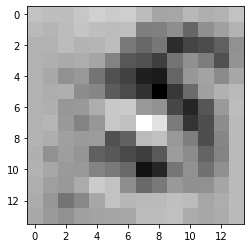

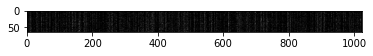

iter:  9900 train_cost:  0.0 train_acc:  1.0 test_cost:  75.761566 test_acc:  0.984375 num_of_returned_sensors: 7
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(64, 10)
(64, 784)
(6

In [3]:
import tensorflow as tf
import matplotlib.pyplot as plt

n_classes=10
learning_rate=0.002
batch_size=64
num_inputs = 784
num_outputs= 10

# Create some wrappers for simplicity
def conv2d(x, W, b, strides=1):
    # Conv2D wrapper, with bias and relu activation
    x = tf.nn.conv2d(x, W, strides=[1, strides, strides, 1], padding='SAME')
    x = tf.nn.bias_add(x, b)
    return x

# tf Graph input
x = tf.placeholder(tf.float32, [None, num_inputs],name = 'input')
y = tf.placeholder(tf.float32, [None, num_outputs],name =  'output')


def maxpool2d(x, k=2):
    # MaxPool2D wrapper
    return tf.nn.max_pool(x, ksize=[1, k, k, 1], strides=[1, k, k, 1],
                          padding='SAME')


# Create model
def conv_net(x, weights, biases):
    # Reshape input picture
    with tf.name_scope('input-reshape'):
        x = tf.reshape(x, shape=[-1, 28, 28, 1])
   
    # Convolution Layer
    with tf.name_scope('conv-1'): 
        conv_pre_actv_1 = conv2d(x, weights['wc1'], biases['bc1'])
        conv_actv_1 = tf.nn.relu(conv_pre_actv_1) 
        print('conv_actv_1 max',conv_actv_1.get_shape().as_list())

    # Max Pooling (down-sampling)
    with tf.name_scope('maxpooling-1'): 
        conv1 = maxpool2d(conv_actv_1, k=2)
        print('con1_after max',conv1.get_shape().as_list())


    # Convolution Layer
    with tf.name_scope('conv-2'):
        conv_pre_actv_2 = conv2d(conv1, weights['wc2'], biases['bc2'])
        conv_actv_2 = tf.nn.relu(conv_pre_actv_2)
        print('con2_before max',conv_actv_2.get_shape().as_list())

    # Max Pooling (down-sampling)
    with tf.name_scope('maxpooling-2'): 
        conv2 = maxpool2d(conv_actv_2, k=2)
        print('con2_after max', conv2.get_shape().as_list())

    # Fully connected layer
    # Reshape conv2 output to fit fully connected layer input
    #wd1 numx3x3  wd1.get_shape() -> numx9 
    with tf.name_scope('flatten'):
        fc1 = tf.reshape(conv2, [-1, weights['wd1'].get_shape().as_list()[0]])
        fc1 = tf.add(tf.matmul(fc1, weights['wd1']), biases['bd1'])
        fc1 = tf.nn.relu(fc1)
    
    # Apply Dropout
    #fc1 = tf.nn.dropout(fc1, dropout)

    # Output, class prediction
    with tf.name_scope('output'):
        out = tf.add(tf.matmul(fc1, weights['out']), biases['out'])
        
    list_of_tensors = [conv_pre_actv_1,conv_actv_1, conv1,conv_pre_actv_2,conv_actv_2, conv2, fc1]
    return out, list_of_tensors


# Store layers weight & bias
weights = {
    # 5x5 conv, 1 input, 32 outputs
    'wc1': tf.Variable(tf.random_normal([5, 5, 1, 32]), name="wc1"),
    # 5x5 conv, 32 inputs, 64 outputs
    'wc2': tf.Variable(tf.random_normal([5, 5, 32, 64]), name="wc2"),
    # fully connected, 7*7*64 inputs, 1024 outputs
    'wd1': tf.Variable(tf.random_normal([7*7*64, 1024]),  name="wd1"),
    # 1024 inputs, 10 outputs (class prediction)
    'out': tf.Variable(tf.random_normal([1024, n_classes]),  name="wo")
}

biases = {
    'bc1': tf.Variable(tf.random_normal([32]),name="bc1"),
    'bc2': tf.Variable(tf.random_normal([64]),name="bc2"),
    'bd1': tf.Variable(tf.random_normal([1024]),name="bd1"),
    'out': tf.Variable(tf.random_normal([n_classes],name="bo"))
}

y_p,list_of_tensors = conv_net(x, weights, biases)

#crossentropy cost
with tf.name_scope('cross_entropy'):
    cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=y_p, labels=y)) # cross entropy cost

cost_summary= tf.summary.scalar('cross_entropy', cost)


# Evaluate model
with tf.name_scope('accuracy_calculation'):
    correct_pred = tf.equal(tf.argmax(y_p, 1), tf.argmax(y, 1))
    accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32))

#merged = tf.summary.scalar('accuracy', accuracy)
acc_summary = tf.summary.scalar('accuracy', accuracy)

def variable_summaries(var):
  with tf.name_scope('summaries'):
    mean = tf.reduce_mean(var)
    mean_summary = tf.summary.scalar('mean', mean)
    with tf.name_scope('stddev'):
      stddev = tf.sqrt(tf.reduce_mean(tf.square(var - mean)))
    stddev_summary = tf.summary.scalar('stddev', stddev)
    max_summary = tf.summary.scalar('max', tf.reduce_max(var))
    min_summary = tf.summary.scalar('min', tf.reduce_min(var))
    hits_summary = tf.summary.histogram('histogram', var)

variable_summaries(weights['wc1'])
variable_summaries(weights['wc2'])
variable_summaries(weights['wd1'])
variable_summaries(weights['out'])

variable_summaries(biases['bc1'])
variable_summaries(biases['bc2'])
variable_summaries(biases['bd1'])
variable_summaries(biases['out'])

# optimisation 
with tf.name_scope('optimisation'):
    optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)

# initalizing the graph and the weights
merged = tf.summary.merge_all()
init = tf.global_variables_initializer()



# Launch the graph
with tf.Session() as sess:
    #graph_writer = tf.summary.FileWriter('./log/train', sess.graph)
    #graph_writer.add_summary()
    train_writer = tf.summary.FileWriter('./log/train', sess.graph)
    test_writer = tf.summary.FileWriter('./log/test')
    sess.run(init)
    print('started')
    
    for i in range(10000):
        batch_x, batch_y = mnist.train.next_batch(batch_size)
        print(batch_x.shape)
        print(batch_y.shape)

        sess.run(optimizer, feed_dict={x: batch_x, y: batch_y})

        summary,train_cost , train_acc = sess.run([merged,cost,accuracy], feed_dict={x: batch_x,y: batch_y})
        train_writer.add_summary(summary, i)

        test_batch_x, test_batch_y = mnist.test.next_batch(batch_size)

        summary,test_cost, test_acc  = sess.run([merged,cost,accuracy], feed_dict={x: test_batch_x,y: test_batch_y})
        test_writer.add_summary(summary, i)
        
        if i % 100 ==0:

            val_list_of_tensors = sess.run(list_of_tensors, feed_dict={x: test_batch_x})
            num_of_returned_sensors = len(val_list_of_tensors)
            
            print(val_list_of_tensors[-1].shape)
            
            imshow(val_list_of_tensors[0][0,:,:,0], cmap='gray')# conv1 pre-activation first input image first filter
            plt.show()
            
            imshow(val_list_of_tensors[1][0,:,:,0],  cmap='gray')# conv1 after-activation first input image first filter
            plt.show()

            
            imshow(val_list_of_tensors[2][0,:,:,0], cmap='gray')# conv2 pre-activation first input image first filter
            plt.show()
            
            imshow(val_list_of_tensors[3][0,:,:,0], cmap='gray')# conv2 after-activation first input image first filter
            plt.show()
            
            imshow(val_list_of_tensors[-1], cmap='gray')# conv2 pre-activation first input image first filter
            plt.show()


            print('iter: ',i, 'train_cost: ', train_cost, 'train_acc: ', train_acc,'test_cost: ', test_cost, 'test_acc: ', test_acc, 'num_of_returned_sensors:', num_of_returned_sensors )


    #y_p_p = sess.run(y_p, feed_dict={x: x_gr, y: y_gr})
    #print('predicted ', y_p_p)
    #print('real ', y_gr)



In [5]:
%load_ext tensorboard

%tensorboard --logdir log


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 674), started 0:00:19 ago. (Use '!kill 674' to kill it.)

# Tensorboard viz


In [ ]:
n_classes=10
learning_rate=0.002
batch_size=64

import tensorflow as tf

import matplotlib.pyplot as plt
# Create some wrappers for simplicity
def conv2d(x, W, b, strides=1):
    # Conv2D wrapper, with bias and relu activation
    x = tf.nn.conv2d(x, W, strides=[1, strides, strides, 1], padding='SAME')
    x = tf.nn.bias_add(x, b)
    return x


num_inputs = 784
num_outputs= 10

# tf Graph input
x = tf.placeholder(tf.float32, [None, num_inputs],name = 'input')
y = tf.placeholder(tf.float32, [None, num_outputs],name =  'output')


def maxpool2d(x, k=2):
    # MaxPool2D wrapper
    return tf.nn.max_pool(x, ksize=[1, k, k, 1], strides=[1, k, k, 1],
                          padding='SAME')


# Create model
def conv_net(x, weights, biases):
    # Reshape input picture
    
    with tf.name_scope('input-reshape'):
        x = tf.reshape(x, shape=[-1, 28, 28, 1])

    with tf.name_scope('conv-1'):

        # Convolution Layer
        conv_pre_actv_1 = conv2d(x, weights['wc1'], biases['bc1'])
        conv_actv_1 = tf.nn.relu(conv_pre_actv_1)
        
        print('conv_actv_1 max',conv_actv_1.get_shape().as_list())

    with tf.name_scope('maxpooling-1'):
        
        # Max Pooling (down-sampling)
        conv1 = maxpool2d(conv_actv_1, k=2)
        print('con1_after max',conv1.get_shape().as_list())


    # Convolution Layer
    with tf.name_scope('conv-2'):

        conv_pre_actv_2 = conv2d(conv1, weights['wc2'], biases['bc2'])
        conv_actv_2 = tf.nn.relu(conv_pre_actv_2)

        
        print('con2_before max',conv_actv_2.get_shape().as_list())


    with tf.name_scope('maxpooling-2'):
        
     
        # Max Pooling (down-sampling)
        conv2 = maxpool2d(conv_actv_2, k=2)
        print('con2_after max', conv2.get_shape().as_list())

    # Fully connected layer
    # Reshape conv2 output to fit fully connected layer input
    #wd1 numx3x3  wd1.get_shape() -> numx9 
    with tf.name_scope('flatten'):
    
        fc1 = tf.reshape(conv2, [-1, weights['wd1'].get_shape().as_list()[0]])
        fc1 = tf.add(tf.matmul(fc1, weights['wd1']), biases['bd1'])
        fc1 = tf.nn.relu(fc1)
    # Apply Dropout
    #fc1 = tf.nn.dropout(fc1, dropout)

    # Output, class prediction
    with tf.name_scope('output'):
    
        out = tf.add(tf.matmul(fc1, weights['out']), biases['out'])
        
    list_of_tensors = [conv_pre_actv_1,conv_actv_1, conv1,conv_pre_actv_2,conv_actv_2, conv2, fc1]
    return out, list_of_tensors


# Store layers weight & bias
weights = {
    # 5x5 conv, 1 input, 32 outputs
    'wc1': tf.Variable(tf.random_normal([5, 5, 1, 32]), name="wc1"),
    # 5x5 conv, 32 inputs, 64 outputs
    'wc2': tf.Variable(tf.random_normal([5, 5, 32, 64])),
    # fully connected, 7*7*64 inputs, 1024 outputs
    'wd1': tf.Variable(tf.random_normal([7*7*64, 1024])),
    # 1024 inputs, 10 outputs (class prediction)
    'out': tf.Variable(tf.random_normal([1024, n_classes]))
}

biases = {
    'bc1': tf.Variable(tf.random_normal([32])),
    'bc2': tf.Variable(tf.random_normal([64])),
    'bd1': tf.Variable(tf.random_normal([1024])),
    'out': tf.Variable(tf.random_normal([n_classes]))
}

y_p,list_of_tensors = conv_net(x, weights, biases)

#crossentropy cost
with tf.name_scope('cross_entropy'):

    cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=y_p, labels=y)) # cross entropy cost

#tf.summary.scalar('cross_entropy', cost)


# Evaluate model
with tf.name_scope('accuracy'):

    correct_pred = tf.equal(tf.argmax(y_p, 1), tf.argmax(y, 1))
    accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32))
#
acc_summary = tf.summary.scalar('accuracy', accuracy)



# optimisation 
with tf.name_scope('optimisation'):

    optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)

# initalizing the graph and the weights
#merged = tf.summary.merge_all()

init = tf.global_variables_initializer()



# Launch the graph
with tf.Session() as sess:
    #graph_writer = tf.summary.FileWriter('./log/train', sess.graph)
    #graph_writer.add_summary()
    train_writer = tf.summary.FileWriter('./log2/train', sess.graph)
    test_writer = tf.summary.FileWriter('./log2/test')
    sess.run(init)
    print('started')
    
    for i in range(10000):
        
        
        
        batch_x, batch_y = mnist.train.next_batch(batch_size)
        

        sess.run(optimizer, feed_dict={x: batch_x, y: batch_y})


        summary,train_cost , train_acc = sess.run([acc_summary,cost,accuracy], feed_dict={x: batch_x,y: batch_y})
        train_writer.add_summary(summary, i)

        #print('started')

        test_batch_x, test_batch_y = mnist.test.next_batch(batch_size)

        summary,test_cost, test_acc  = sess.run([acc_summary,cost,accuracy], feed_dict={x: test_batch_x,y: test_batch_y})
        test_writer.add_summary(summary, i)

        if i % 100 ==0:
            
           
            val_list_of_tensors = sess.run(list_of_tensors, feed_dict={x: test_batch_x})
            num_of_returned_sensors = len(val_list_of_tensors)
            
            print(val_list_of_tensors[-1].shape)
            
            imshow(val_list_of_tensors[0][0,:,:,0], cmap='gray')# conv1 pre-activation first input image first filter

            plt.show()
            imshow(val_list_of_tensors[1][0,:,:,0],  cmap='gray')# conv1 after-activation first input image first filter
            plt.show()

            
            imshow(val_list_of_tensors[2][0,:,:,0], cmap='gray')# conv2 pre-activation first input image first filter

            plt.show()
            imshow(val_list_of_tensors[3][0,:,:,0], cmap='gray')# conv2 after-activation first input image first filter
            plt.show()
            
            imshow(val_list_of_tensors[-1], cmap='gray')# conv2 pre-activation first input image first filter
            plt.show()


            print('iter: ',i, 'train_cost: ', train_cost, 'train_acc: ', train_acc,'test_cost: ', test_cost, 'test_acc: ', test_acc, 'num_of_returned_sensors:', num_of_returned_sensors )


    #y_p_p = sess.run(y_p, feed_dict={x: x_gr, y: y_gr})
    
    print('predicted ', y_p_p)
    print('real ', y_gr)



In [ ]:
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip ngrok-stable-linux-amd64.zip

In [ ]:
!rm -rf log

In [ ]:
LOG_DIR = './log2'
get_ipython().system_raw(
    'tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'
    .format(LOG_DIR)
)

In [ ]:
get_ipython().system_raw('./ngrok http 6006 &')

In [ ]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"